In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
#train_loader, valid_loader, test_loader = mnist(valid=10000, transform=transforms.ToTensor())

mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
           ])
train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)

In [4]:
def get_random_h():
    z = torch.randn((50, 16))     
    return z

In [5]:
batch_size = 50
batch_zeros = torch.zeros((batch_size, 1))
batch_ones = torch.ones((batch_size, 1))

In [6]:
fixed_data, fixed_cl = next(iter(test_loader))
fixed_h = get_random_h()
fixed_z_label = torch.tensor(list(range(10))).repeat((5))

In [7]:
class ConvLayer(nn.Module):
    def __init__(self, size, padding=1, pool_layer=nn.MaxPool2d(2, stride=2),
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), stride=1):
        super(ConvLayer, self).__init__()
        layers = []
        layers.append(nn.Conv2d(size[0], size[1], size[2], padding=padding, stride=stride))
        if pool_layer is not None:
            layers.append(pool_layer)
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [8]:
class DeconvLayer(nn.Module):
    def __init__(self, size, padding=1, stride=1, 
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), output_padding=0):
        super(DeconvLayer, self).__init__()
        layers = []
        layers.append(nn.ConvTranspose2d(size[0], size[1], size[2], padding=padding, 
                                         stride=stride, output_padding=output_padding))
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [9]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [10]:
class Net(nn.Module):
    def __init__(self, batchnorm=False, dropout=False, optim_type='SGD', **optim_params):
        super(Net, self).__init__()
        
        self.latent_size = 16
        
        self._conv1 = ConvLayer([1, 16, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None)
        self._conv2 = ConvLayer([16, 32, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None)
        self._conv3 = ConvLayer([32, 32, 3], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None)
        
        self.latent_fn = nn.Sigmoid()
                    
        self.fce = FullyConnected([32*2*2, self.latent_size])
        self.fcd = FullyConnected([self.latent_size, 32*2*2])
        
        self._deconv1 = DeconvLayer([32, 32, 3], stride=2, padding=0, bn=batchnorm)
        self._deconv2 = DeconvLayer([32, 16, 4], stride=2, padding=0, bn=batchnorm, output_padding=1)
        self._deconv3 = DeconvLayer([16, 1, 4], stride=2, padding=0, bn=batchnorm, activation_fn=nn.Tanh())
    
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
                    
        self.discr = FullyConnected([self.latent_size, 256, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True)       
        self.d_optimizer = optim.Adam(self.discr.parameters(), **optim_params)
       
    def conv(self, x):
        l1 = self._conv1(x)
        l2 = self._conv2(l1)
        l3 = self._conv3(l2)
        return l3, l2, l1
    
    def encode(self, x):
        l3 = self.conv(x)[0]
        flatten = l3.view(-1, 32*2*2)
        h = self.latent_fn(self.fce(flatten))
        return h
    
    def decode(self, h):
        flatten = self.fcd(h)
        l1 = flatten.view(-1, 32, 2, 2)
        l2 = self._deconv1(l1)
        l3 = self._deconv2(l2)
        x = self._deconv3(l3)
        return x
    
    def discriminator(self, x):        
        x = self.discr(x)       
        return x
                
    def forward(self, x):
        self.h = self.encode(x)
        x = self.decode(self.h)
        return x
    
    def ae_loss(self, data):
                       
        output = self.forward(data)     
        self._reconst_loss = F.mse_loss(output, data) 
        
        encoded = self.encode(data) 
        fake_pred = self.discriminator(encoded) 
        self._discr_loss = 0.1 * F.binary_cross_entropy_with_logits(fake_pred, batch_ones)        
        
        self._ae_loss = self._reconst_loss + self._discr_loss
                        
        return self._ae_loss
    
    def ds_loss(self, data):
                       
        encoded = self.encode(data)           
        fake_pred = self.discriminator(encoded)
        true_pred = self.discriminator(torch.randn((batch_size, self.latent_size)))

        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones) 
        self._ds_loss = 0.5*(fake_loss + true_loss)
        
        return self._ds_loss

In [11]:
models = {
   # 'Adam Discr': Net(False, False, optim_type='Adam', lr=1e-4),
    'Adam Discr+bn+dp': Net(True, True, optim_type='Adam', lr=1e-4),
}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [12]:
def train(epoch, models, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, _) in enumerate(train_loader):
        for model in models.values():
            
            # train discriminator
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                     
            ds_loss = model.ds_loss(data)        
            ds_loss.backward()
            model.d_optimizer.step()
                        
            # train AE
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                      
            ae_loss = model.ae_loss(data)            
            ae_loss.backward()
            model.optim.step()
                       
            
        if batch_idx % 200 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
        if log is not None:
            for k in models:
                log[k].append((models[k]._ae_loss, models[k]._ds_loss))
        print(line + losses)

In [13]:
def plot_latent(images, shape):
    fig = plt.figure(figsize=shape[::-1], dpi=80)
    for j in range(1, len(images) + 1):
        ax = fig.add_subplot(shape[0], shape[1], j)
        ax.matshow(images[j - 1, 0, :, :], cmap = matplotlib.cm.binary)
        plt.xticks(np.array([]))
        plt.yticks(np.array([]))

    plt.show()
    

In [14]:
def test(models, loader, log=None):
    test_size = len(loader)
    test_rc_loss = {k: 0. for k in models}
    test_ds_loss = {k: 0. for k in models}
    test_discr_loss = {k: 0. for k in models}
    with torch.no_grad():
        for batch_idx, (data, _) in enumerate(train_loader):
            output = {k: m.forward(data) for k, m in models.items()}
            for k, m in models.items():                
                m.ae_loss(data)
                test_rc_loss[k] += m._reconst_loss
                test_discr_loss[k] += m._discr_loss
                test_ds_loss[k] += m.ds_loss(data).item() 
    
    for k in models:
        test_rc_loss[k] /= test_size
        test_discr_loss[k] /= test_size 
        test_ds_loss[k] /= test_size 
    report = 'Test losses: \n' + ''.join(['{}: {:.8f} / {:.8f} / {:.8f} \n'.format(k, test_rc_loss[k], 
                                         test_discr_loss[k], test_ds_loss[k]) 
                                         for k in models])
    if log is not None:
        for k in models:
            log[k].append((test_rc_loss[k], test_discr_loss[k], test_ds_loss[k],))
            with torch.no_grad():
                print ("Model {}:".format(k))
                ae_data = models[k].forward(fixed_data).data.numpy()
                fixed_gen = models[k].decode(fixed_h).data.numpy()
                random_gen = models[k].decode(get_random_h()).data.numpy()
                plot_mnist(ae_data, (5, 10))
                plot_mnist(fixed_gen, (5, 10)) 
                plot_mnist(random_gen, (5, 10)) 

                encoded = model.encode(fixed_data[:10])
                enc_to_lot = encoded.view(-1, 1, 4, 4).clamp(0, 1).data.numpy()
                plot_latent(enc_to_lot, (1, 10))
            
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1647 D:0.6787
Train Epoch: 1 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:0.9380 D:0.1198
Train Epoch: 1 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:0.9297 D:0.0879
Train Epoch: 1 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:0.9966 D:0.0415
Train Epoch: 1 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0285 D:0.0144
Train Epoch: 1 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0603 D:0.0074
Model Adam Discr+bn+dp:


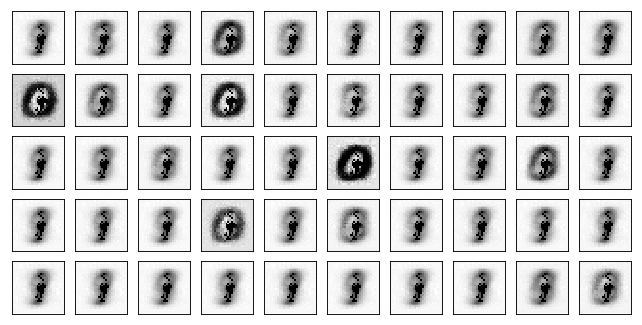

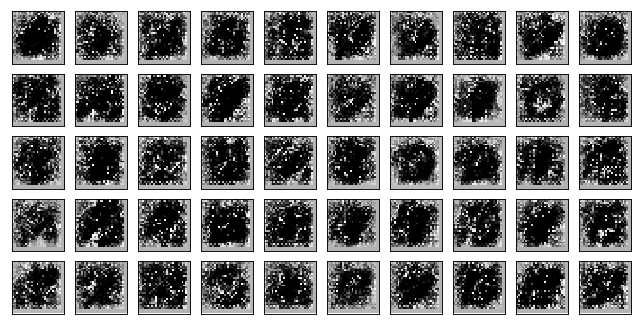

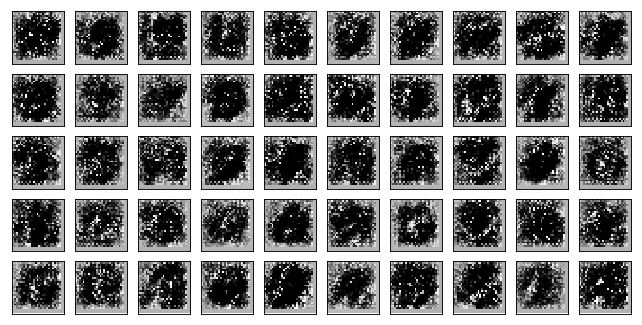

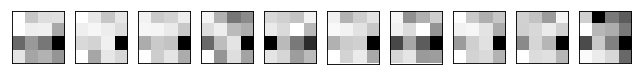

Test losses: 
Adam Discr+bn+dp: 2.91078115 / 2.39903188 / 0.02960989 

Train Epoch: 2 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0695 D:0.0133
Train Epoch: 2 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0708 D:0.0053
Train Epoch: 2 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0953 D:0.0045
Train Epoch: 2 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0836 D:0.0038
Train Epoch: 2 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1067 D:0.0164
Train Epoch: 2 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1041 D:0.0035
Model Adam Discr+bn+dp:


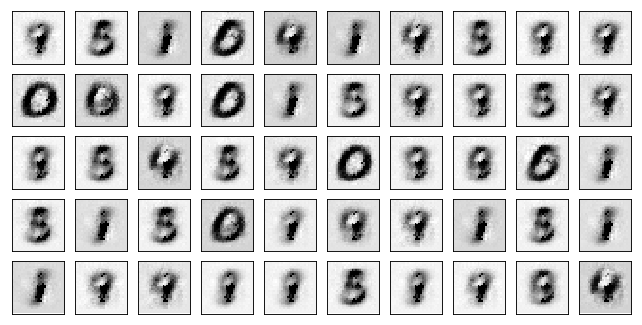

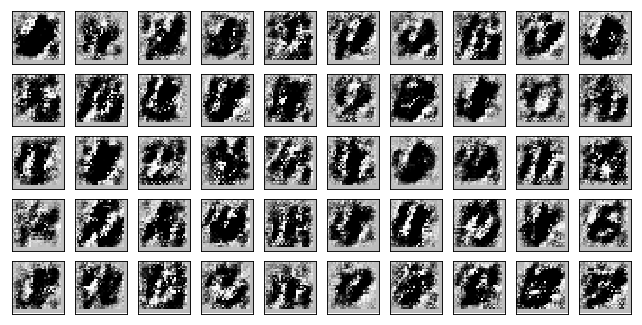

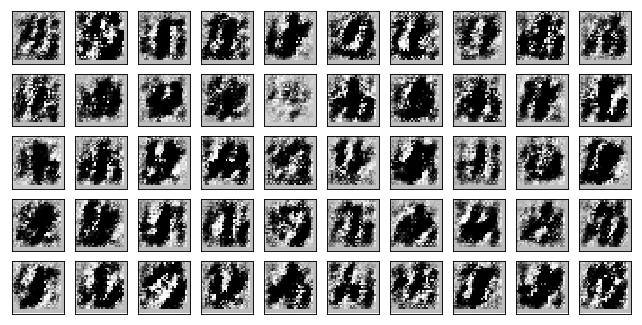

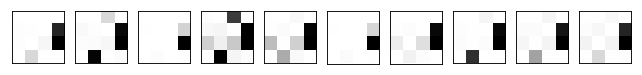

Test losses: 
Adam Discr+bn+dp: 2.38682580 / 3.12080669 / 0.00891936 

Train Epoch: 3 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0989 D:0.0020
Train Epoch: 3 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1313 D:0.0010
Train Epoch: 3 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1166 D:0.0019
Train Epoch: 3 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1408 D:0.0057
Train Epoch: 3 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1268 D:0.0015
Train Epoch: 3 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1419 D:0.0008
Model Adam Discr+bn+dp:


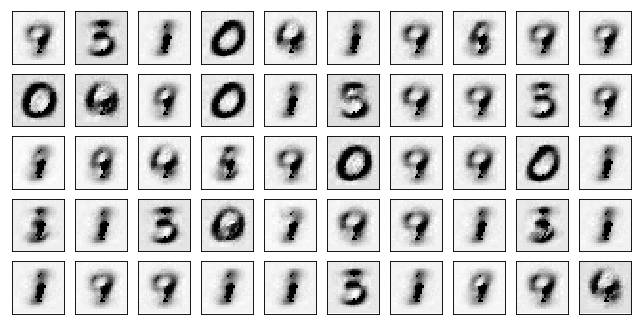

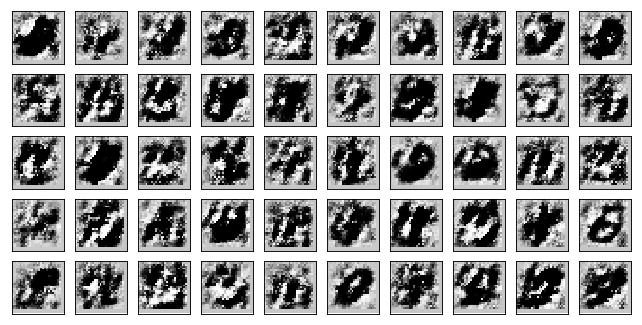

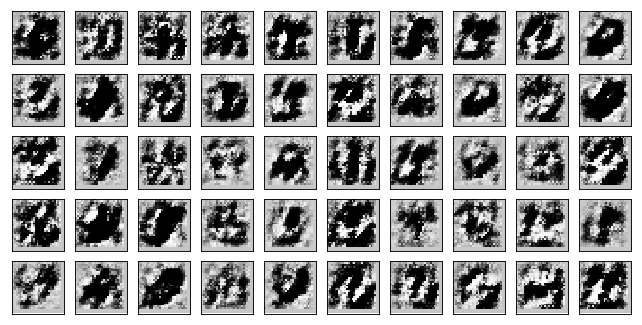

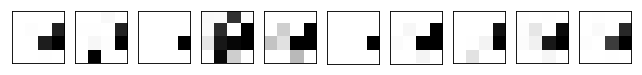

Test losses: 
Adam Discr+bn+dp: 1.99195087 / 3.60198545 / 0.00506113 

Train Epoch: 4 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1396 D:0.0007
Train Epoch: 4 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1310 D:0.0008
Train Epoch: 4 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1027 D:0.0006
Train Epoch: 4 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0994 D:0.0027
Train Epoch: 4 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0564 D:0.0027
Train Epoch: 4 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0672 D:0.0021
Model Adam Discr+bn+dp:


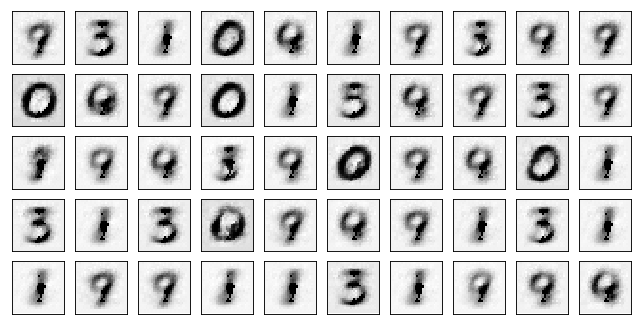

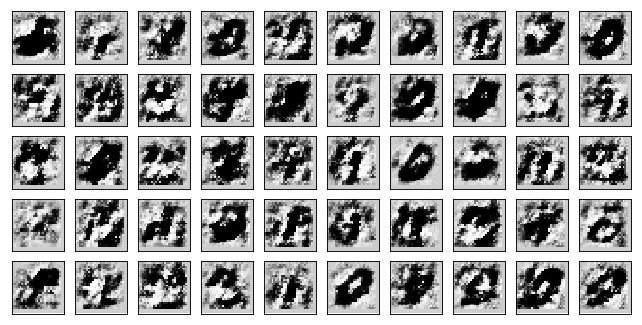

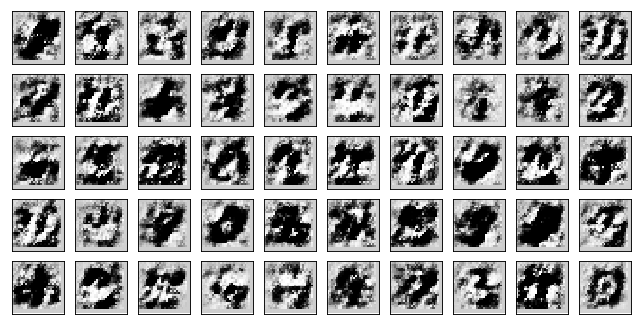

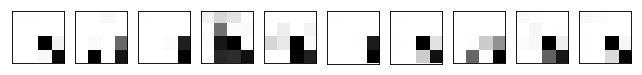

Test losses: 
Adam Discr+bn+dp: 1.76245654 / 3.59168482 / 0.00671001 

Train Epoch: 5 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0730 D:0.0034
Train Epoch: 5 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1020 D:0.0124
Train Epoch: 5 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1825 D:0.0005
Train Epoch: 5 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0405 D:0.0036
Train Epoch: 5 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1151 D:0.0209
Train Epoch: 5 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0721 D:0.0138
Model Adam Discr+bn+dp:


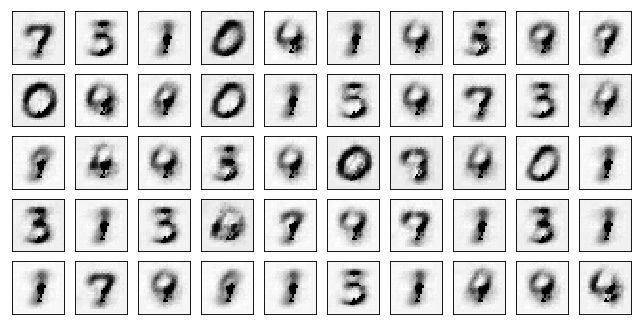

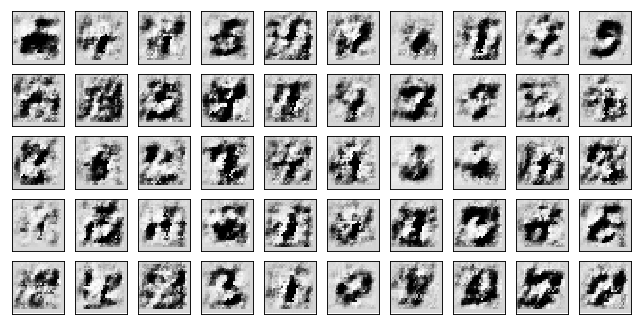

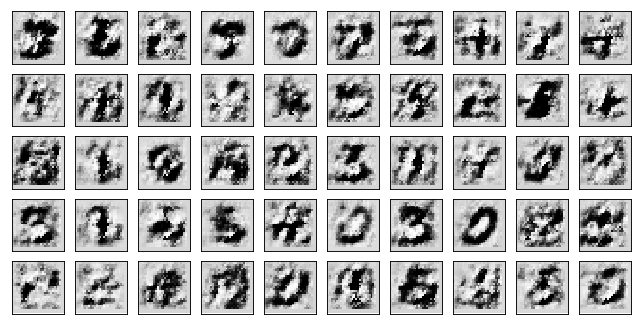

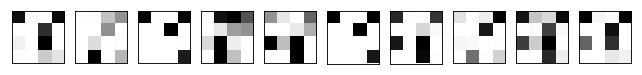

Test losses: 
Adam Discr+bn+dp: 1.57331681 / 3.70223236 / 0.01151983 

Train Epoch: 6 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0516 D:0.0188
Train Epoch: 6 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0968 D:0.0040
Train Epoch: 6 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0896 D:0.0021
Train Epoch: 6 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0568 D:0.0011
Train Epoch: 6 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1101 D:0.0020
Train Epoch: 6 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1225 D:0.0085
Model Adam Discr+bn+dp:


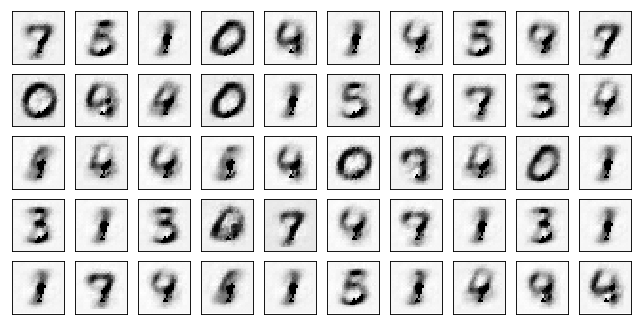

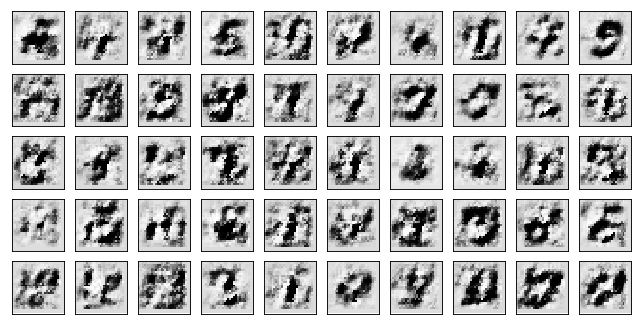

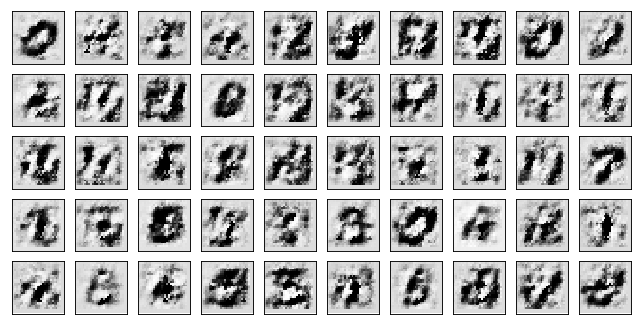

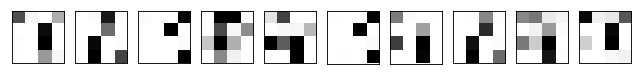

Test losses: 
Adam Discr+bn+dp: 1.42048299 / 4.12819481 / 0.01004785 

Train Epoch: 7 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1189 D:0.0003
Train Epoch: 7 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0680 D:0.0032
Train Epoch: 7 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1054 D:0.0219
Train Epoch: 7 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0456 D:0.0010
Train Epoch: 7 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1033 D:0.0004
Train Epoch: 7 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0623 D:0.0007
Model Adam Discr+bn+dp:


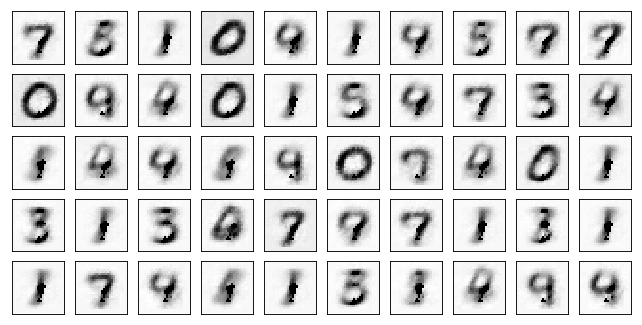

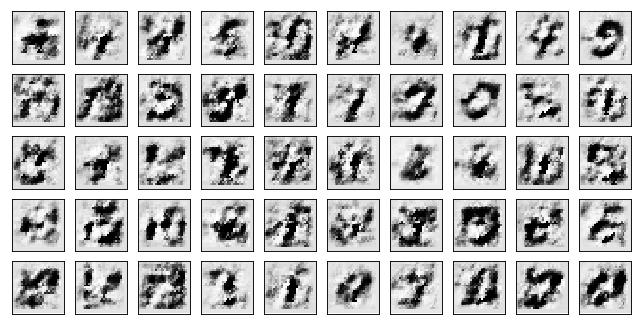

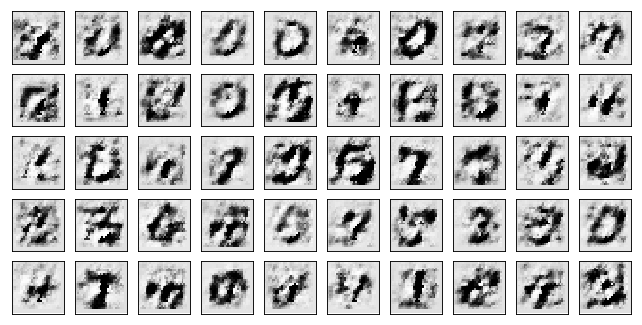

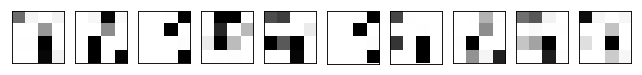

Test losses: 
Adam Discr+bn+dp: 1.30298686 / 4.13368273 / 0.00627760 

Train Epoch: 8 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1284 D:0.0005
Train Epoch: 8 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0553 D:0.0005
Train Epoch: 8 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0597 D:0.0026
Train Epoch: 8 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0367 D:0.0007
Train Epoch: 8 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0683 D:0.0005
Train Epoch: 8 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1015 D:0.0039
Model Adam Discr+bn+dp:


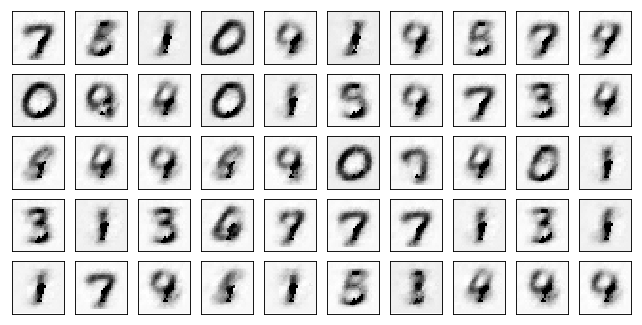

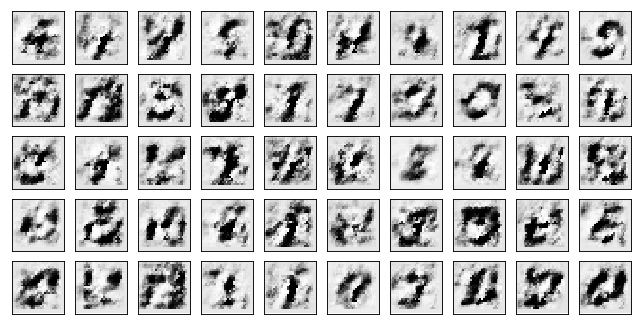

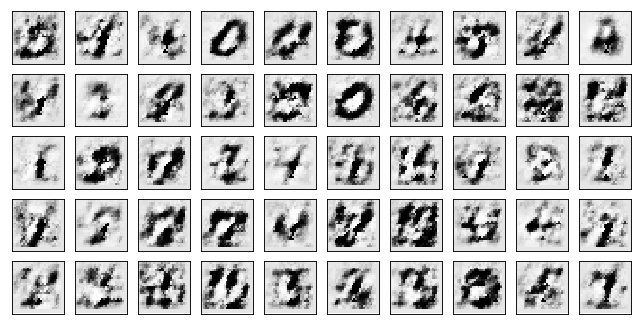

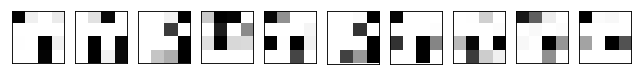

Test losses: 
Adam Discr+bn+dp: 1.23253644 / 4.26599216 / 0.00992754 

Train Epoch: 9 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0398 D:0.0019
Train Epoch: 9 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0510 D:0.0006
Train Epoch: 9 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0857 D:0.0019
Train Epoch: 9 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1766 D:0.0008
Train Epoch: 9 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1168 D:0.0004
Train Epoch: 9 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0890 D:0.0006
Model Adam Discr+bn+dp:


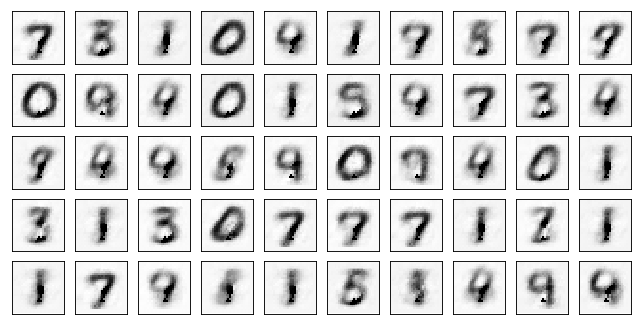

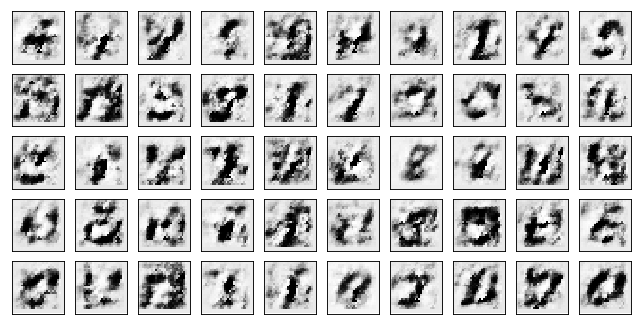

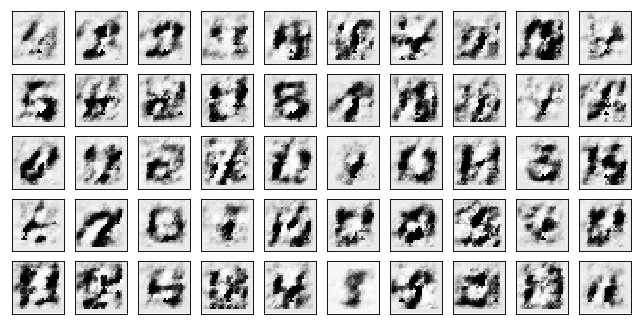

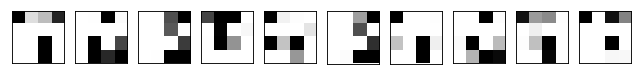

Test losses: 
Adam Discr+bn+dp: 1.14004552 / 4.44021749 / 0.00573860 

Train Epoch: 10 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0866 D:0.0024
Train Epoch: 10 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1152 D:0.0035
Train Epoch: 10 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0874 D:0.0006
Train Epoch: 10 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1082 D:0.0010
Train Epoch: 10 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1122 D:0.0007
Train Epoch: 10 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0504 D:0.0009
Model Adam Discr+bn+dp:


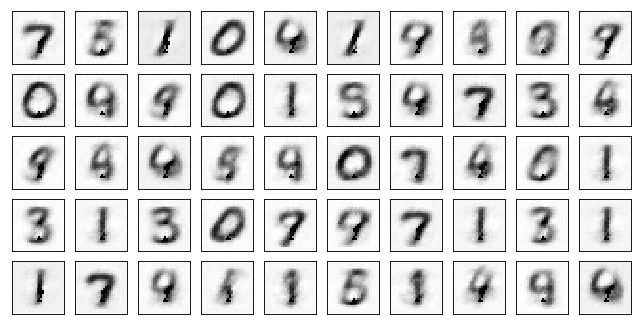

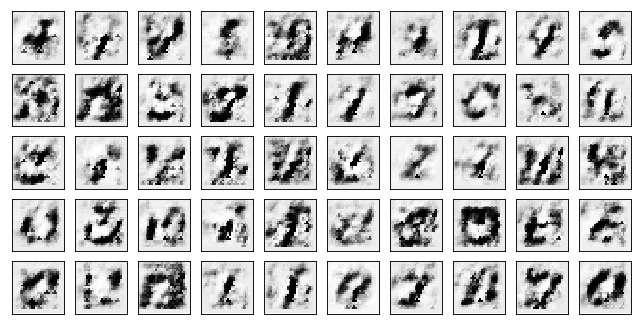

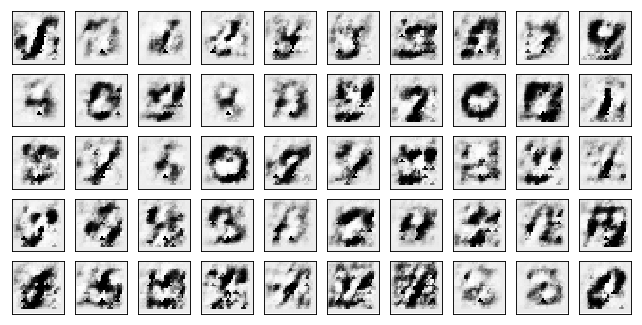

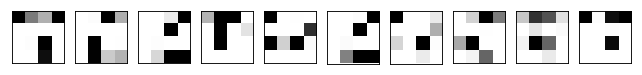

Test losses: 
Adam Discr+bn+dp: 1.07356679 / 4.26632071 / 0.00445940 

Train Epoch: 11 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0679 D:0.0014
Train Epoch: 11 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1053 D:0.0072
Train Epoch: 11 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1232 D:0.0002
Train Epoch: 11 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.2045 D:0.0025
Train Epoch: 11 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1161 D:0.0006
Train Epoch: 11 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1477 D:0.0006
Model Adam Discr+bn+dp:


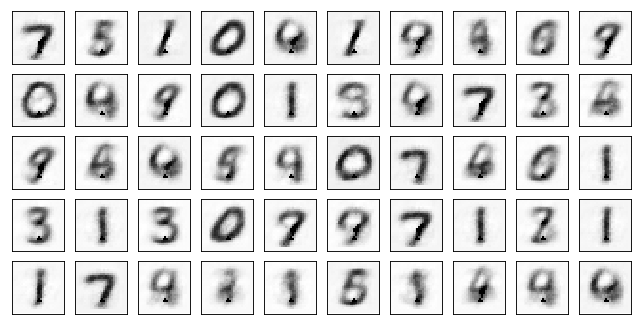

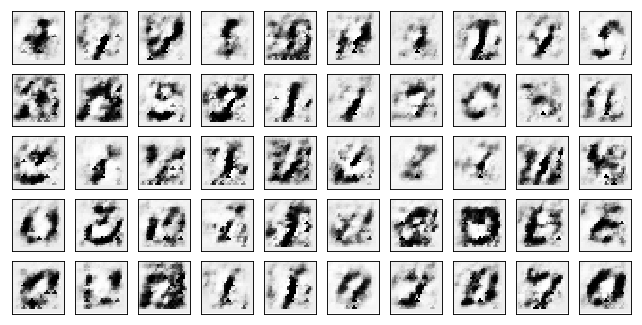

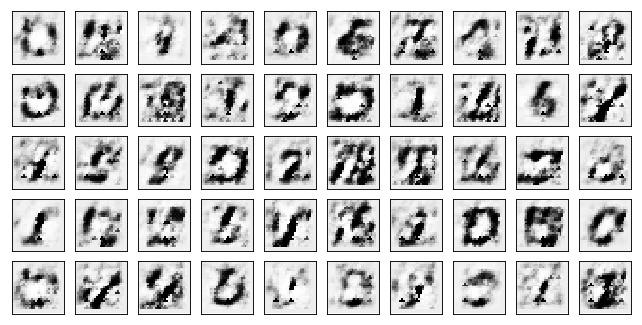

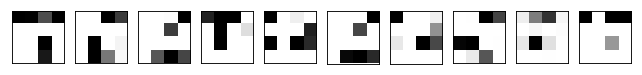

Test losses: 
Adam Discr+bn+dp: 1.03458202 / 4.55569506 / 0.00508647 

Train Epoch: 12 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0504 D:0.0011
Train Epoch: 12 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1490 D:0.0027
Train Epoch: 12 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0881 D:0.0006
Train Epoch: 12 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0297 D:0.0006
Train Epoch: 12 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0570 D:0.0010
Train Epoch: 12 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1176 D:0.0005
Model Adam Discr+bn+dp:


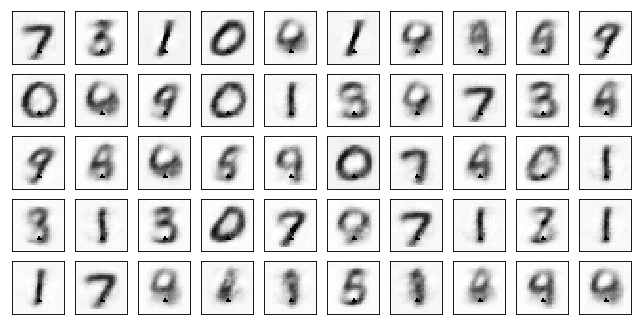

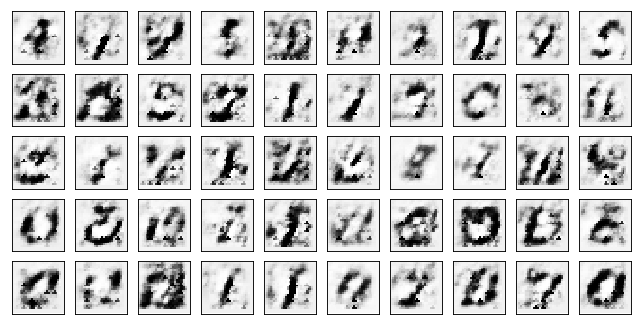

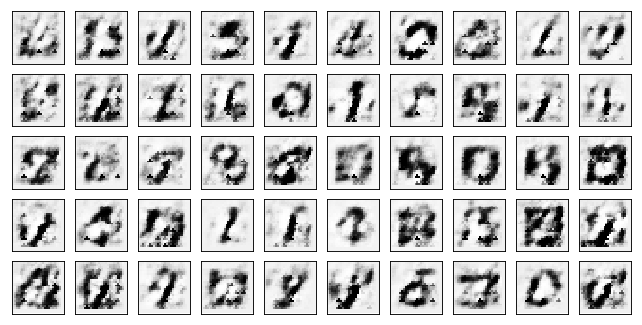

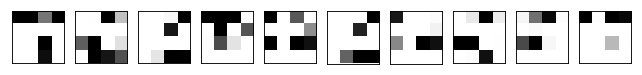

Test losses: 
Adam Discr+bn+dp: 0.99596763 / 4.83190107 / 0.00632688 

Train Epoch: 13 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1680 D:0.0004
Train Epoch: 13 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0356 D:0.0008
Train Epoch: 13 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0932 D:0.0009
Train Epoch: 13 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1314 D:0.0006
Train Epoch: 13 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0602 D:0.0037
Train Epoch: 13 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1150 D:0.0031
Model Adam Discr+bn+dp:


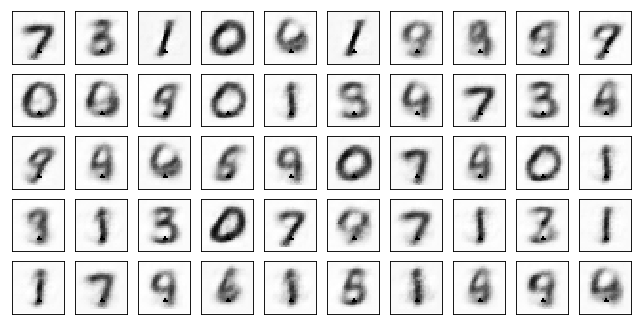

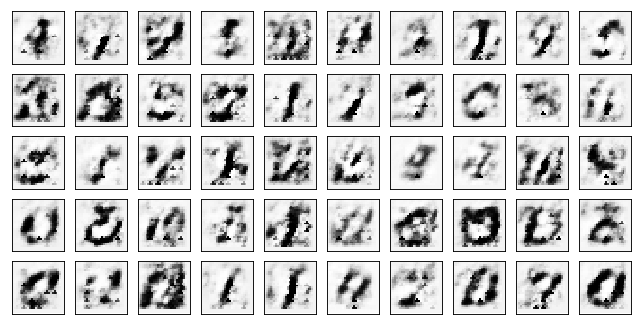

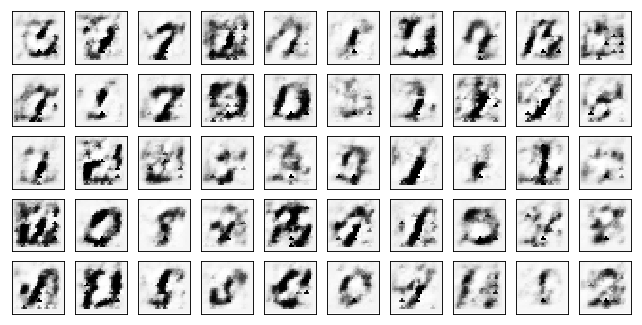

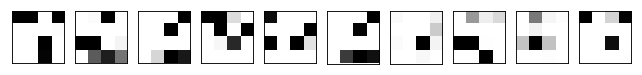

Test losses: 
Adam Discr+bn+dp: 0.97746390 / 4.59612560 / 0.00718267 

Train Epoch: 14 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0692 D:0.0005
Train Epoch: 14 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1124 D:0.0372
Train Epoch: 14 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1097 D:0.0010
Train Epoch: 14 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1333 D:0.0003
Train Epoch: 14 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1504 D:0.0020
Train Epoch: 14 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0772 D:0.0006
Model Adam Discr+bn+dp:


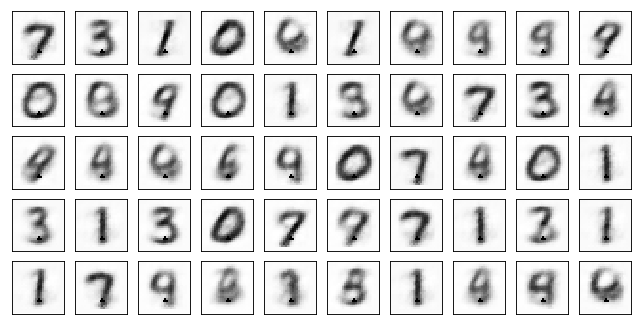

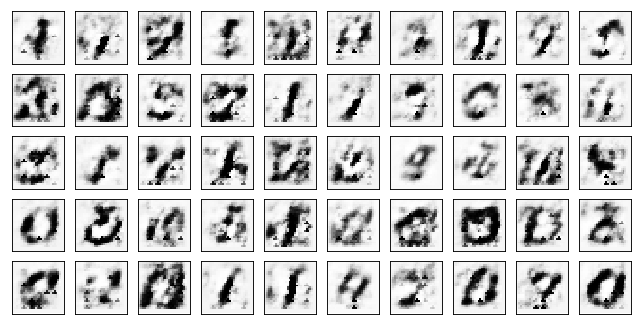

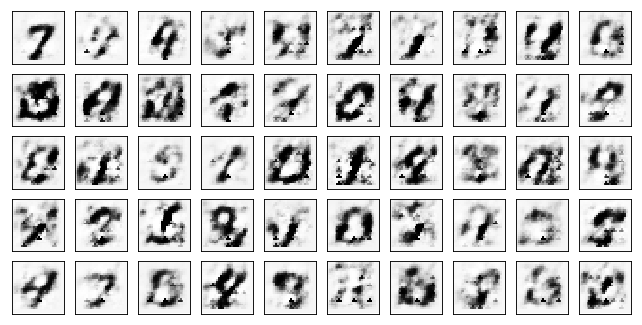

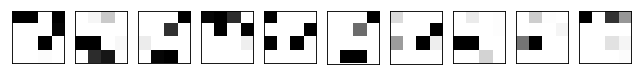

Test losses: 
Adam Discr+bn+dp: 0.97668517 / 4.58882761 / 0.00474343 

Train Epoch: 15 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0997 D:0.0005
Train Epoch: 15 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1027 D:0.0002
Train Epoch: 15 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0169 D:0.0016
Train Epoch: 15 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1400 D:0.0003
Train Epoch: 15 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1181 D:0.0003
Train Epoch: 15 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0692 D:0.0010
Model Adam Discr+bn+dp:


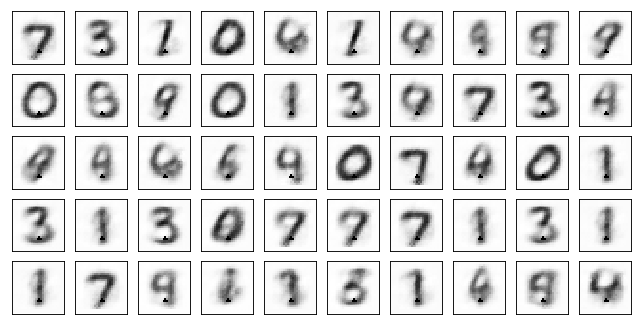

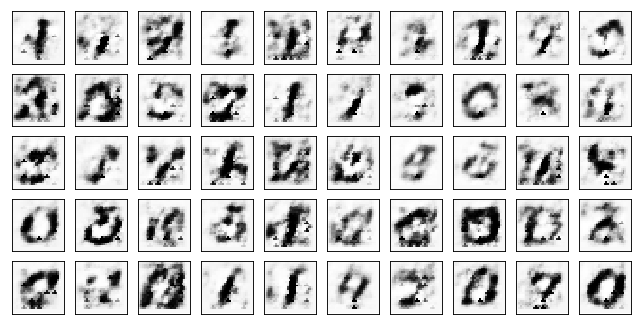

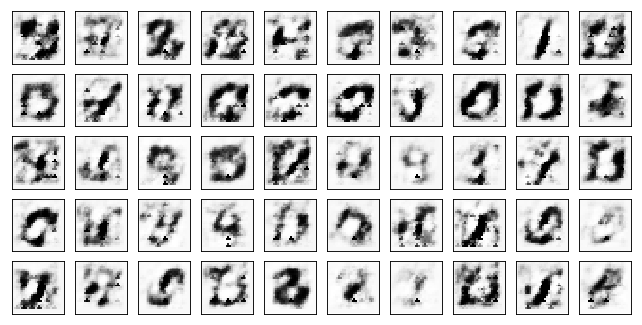

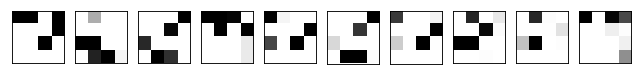

Test losses: 
Adam Discr+bn+dp: 0.98056817 / 4.56680918 / 0.00634276 

Train Epoch: 16 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0533 D:0.0009
Train Epoch: 16 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1427 D:0.0003
Train Epoch: 16 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1659 D:0.0006
Train Epoch: 16 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1436 D:0.0004
Train Epoch: 16 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1540 D:0.0004
Train Epoch: 16 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1093 D:0.0021
Model Adam Discr+bn+dp:


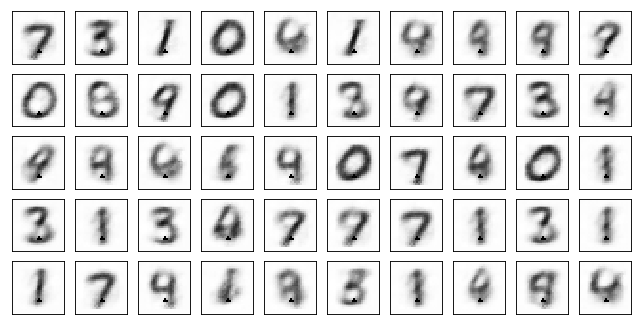

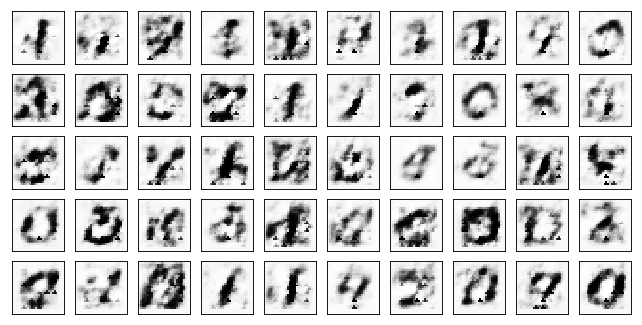

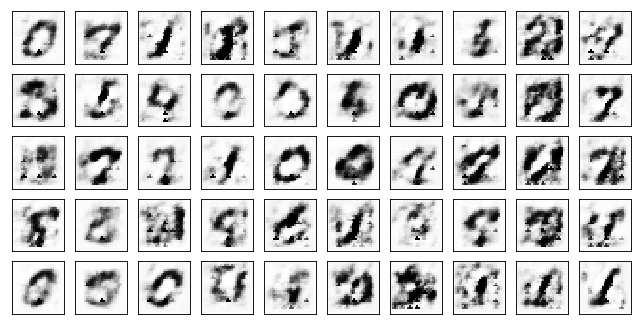

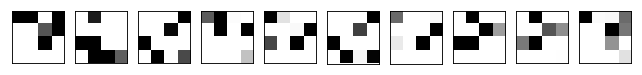

Test losses: 
Adam Discr+bn+dp: 0.95985496 / 4.54707527 / 0.00838572 

Train Epoch: 17 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0459 D:0.0002
Train Epoch: 17 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0677 D:0.0005
Train Epoch: 17 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1416 D:0.0006
Train Epoch: 17 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0871 D:0.0004
Train Epoch: 17 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0583 D:0.0010
Train Epoch: 17 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1453 D:0.0003
Model Adam Discr+bn+dp:


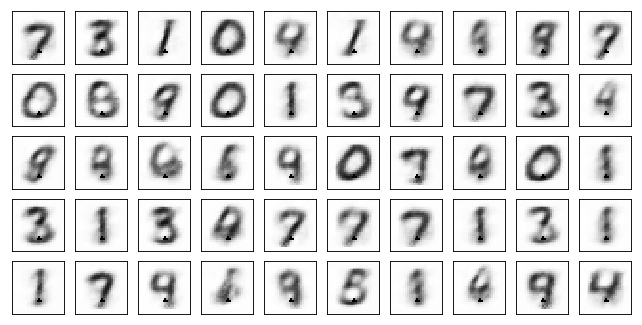

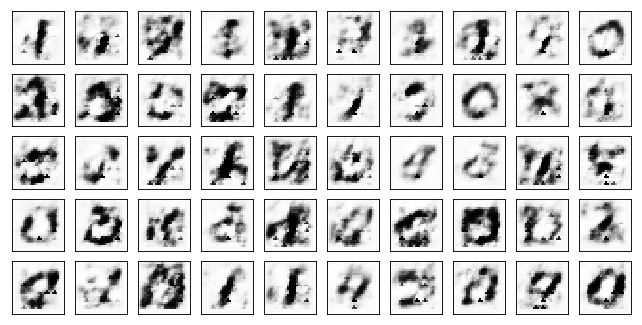

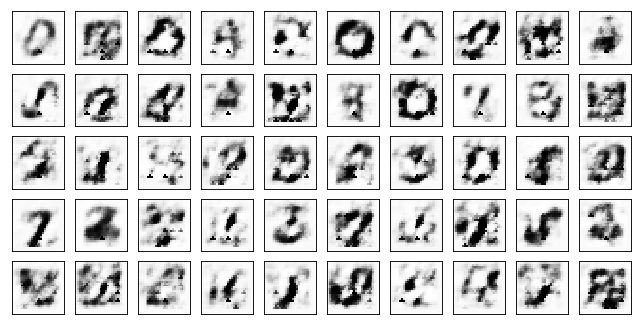

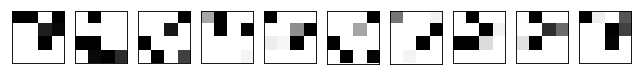

Test losses: 
Adam Discr+bn+dp: 0.94165784 / 4.66314745 / 0.00417473 

Train Epoch: 18 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0912 D:0.0002
Train Epoch: 18 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1281 D:0.0002
Train Epoch: 18 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1044 D:0.0003
Train Epoch: 18 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0626 D:0.0032
Train Epoch: 18 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1161 D:0.0008
Train Epoch: 18 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0906 D:0.0003
Model Adam Discr+bn+dp:


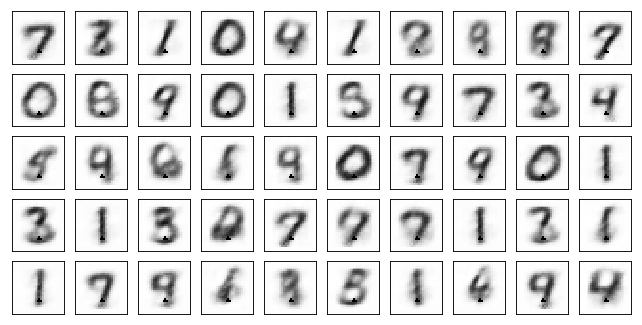

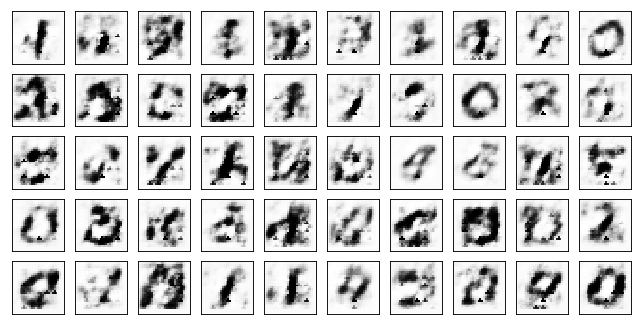

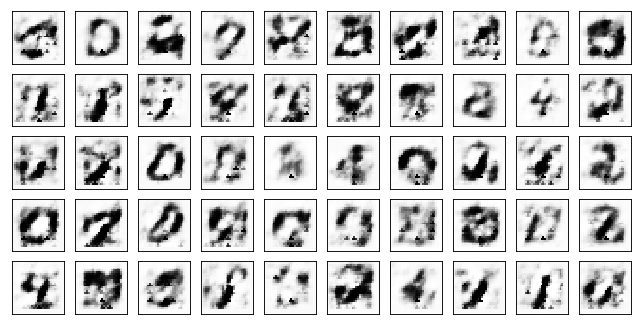

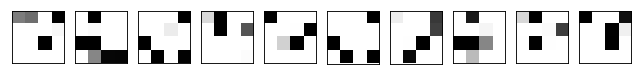

Test losses: 
Adam Discr+bn+dp: 0.92537683 / 4.70115089 / 0.00678809 

Train Epoch: 19 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1081 D:0.0003
Train Epoch: 19 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0736 D:0.0008
Train Epoch: 19 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1310 D:0.0034
Train Epoch: 19 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0969 D:0.0006
Train Epoch: 19 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1003 D:0.0003
Train Epoch: 19 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1180 D:0.0008
Model Adam Discr+bn+dp:


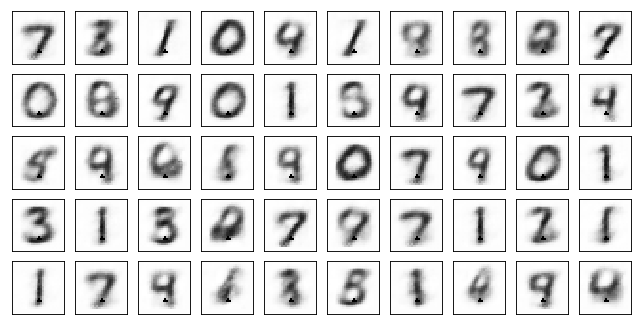

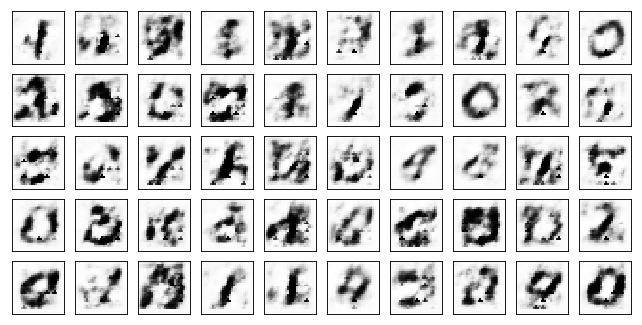

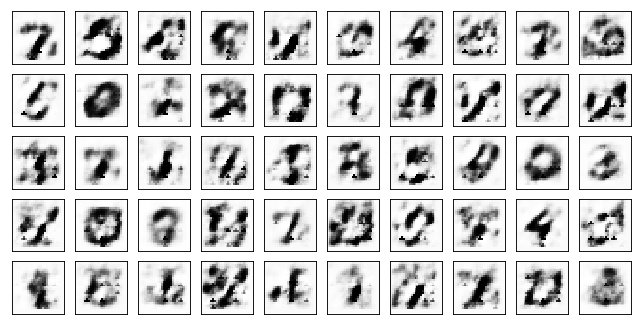

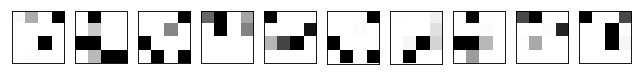

Test losses: 
Adam Discr+bn+dp: 0.91009551 / 4.59345579 / 0.00838940 

Train Epoch: 20 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0694 D:0.0002
Train Epoch: 20 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1836 D:0.0002
Train Epoch: 20 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1203 D:0.0010
Train Epoch: 20 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1685 D:0.0008
Train Epoch: 20 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0788 D:0.0002
Train Epoch: 20 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1758 D:0.0002
Model Adam Discr+bn+dp:


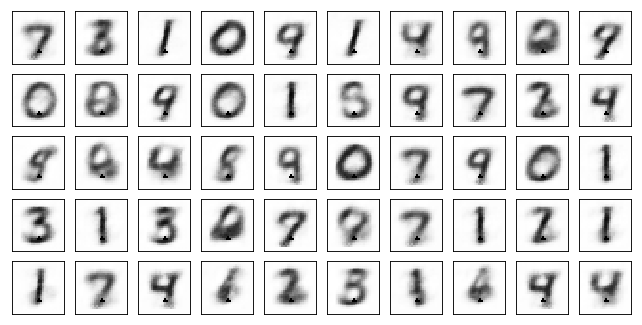

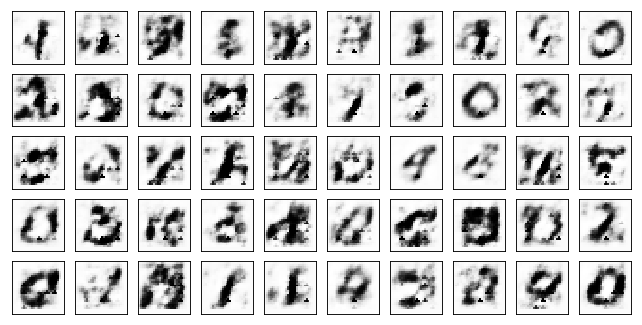

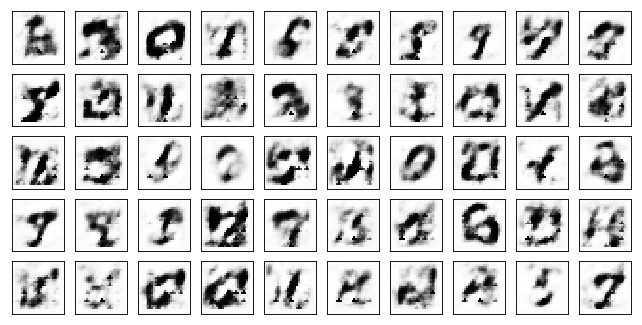

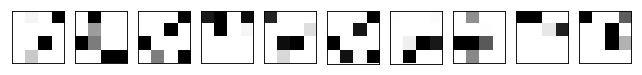

Test losses: 
Adam Discr+bn+dp: 0.90789276 / 4.82165480 / 0.00378717 

Train Epoch: 21 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1321 D:0.0003
Train Epoch: 21 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0885 D:0.0005
Train Epoch: 21 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1770 D:0.0004
Train Epoch: 21 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0495 D:0.0002
Train Epoch: 21 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1702 D:0.0004
Train Epoch: 21 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0806 D:0.0004
Model Adam Discr+bn+dp:


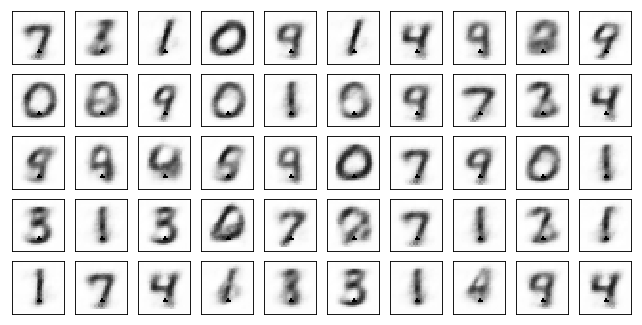

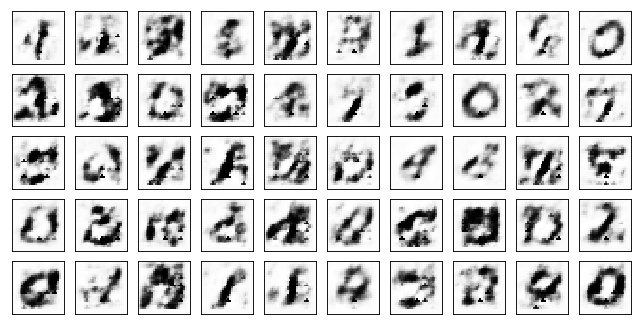

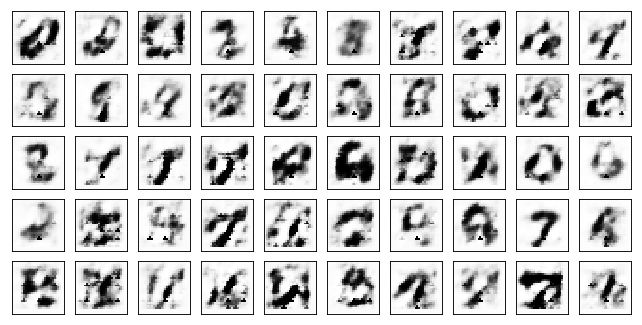

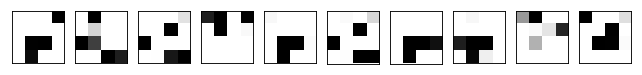

Test losses: 
Adam Discr+bn+dp: 0.91481072 / 4.45886040 / 0.00567481 

Train Epoch: 22 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0205 D:0.0130
Train Epoch: 22 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1487 D:0.0009
Train Epoch: 22 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1549 D:0.0030
Train Epoch: 22 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1761 D:0.0037
Train Epoch: 22 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1315 D:0.0023
Train Epoch: 22 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1432 D:0.0003
Model Adam Discr+bn+dp:


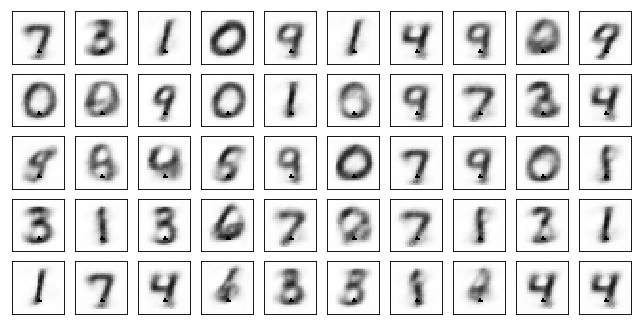

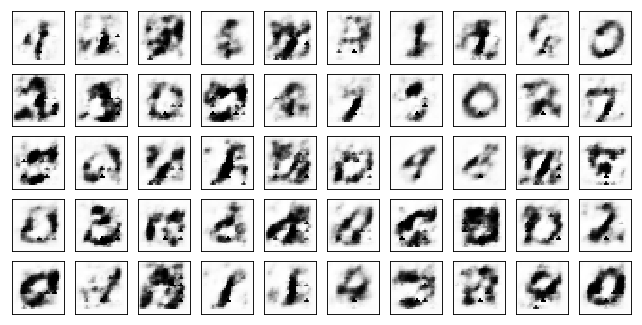

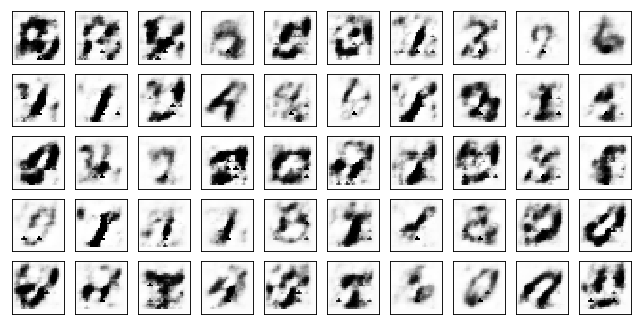

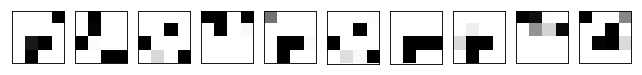

Test losses: 
Adam Discr+bn+dp: 0.90194875 / 4.79154587 / 0.00541221 

Train Epoch: 23 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1611 D:0.0047
Train Epoch: 23 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1362 D:0.0003
Train Epoch: 23 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1244 D:0.0007
Train Epoch: 23 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1554 D:0.0002
Train Epoch: 23 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0864 D:0.0002
Train Epoch: 23 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1319 D:0.0018
Model Adam Discr+bn+dp:


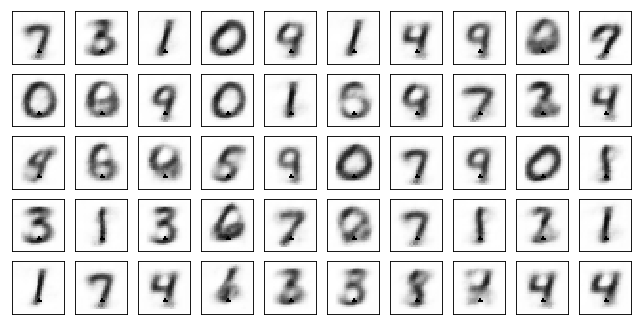

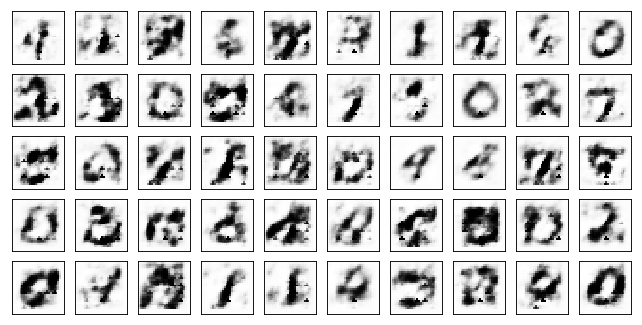

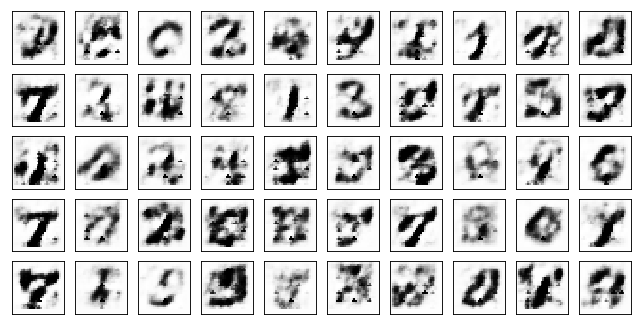

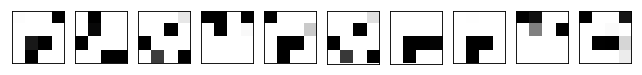

Test losses: 
Adam Discr+bn+dp: 0.90106356 / 4.65431213 / 0.00530724 

Train Epoch: 24 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0908 D:0.0005
Train Epoch: 24 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1484 D:0.0015
Train Epoch: 24 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1573 D:0.0002
Train Epoch: 24 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1406 D:0.0324
Train Epoch: 24 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0513 D:0.0011
Train Epoch: 24 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0775 D:0.0011
Model Adam Discr+bn+dp:


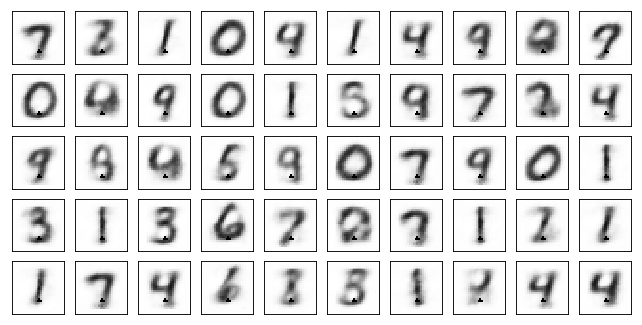

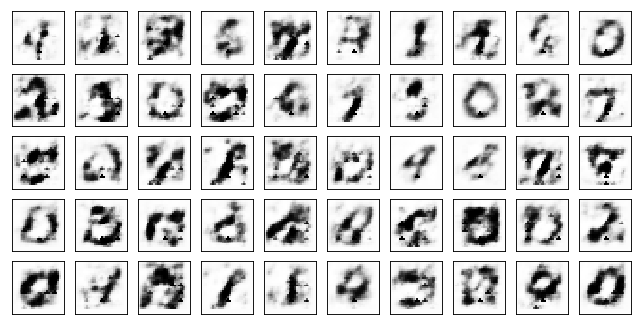

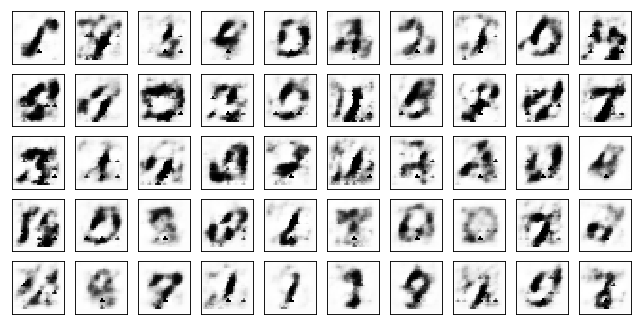

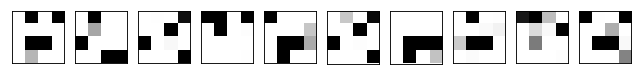

Test losses: 
Adam Discr+bn+dp: 0.88545817 / 4.63681841 / 0.00428424 

Train Epoch: 25 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0932 D:0.0008
Train Epoch: 25 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0847 D:0.0009
Train Epoch: 25 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1424 D:0.0005
Train Epoch: 25 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1499 D:0.0006
Train Epoch: 25 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1125 D:0.0004
Train Epoch: 25 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1457 D:0.0003
Model Adam Discr+bn+dp:


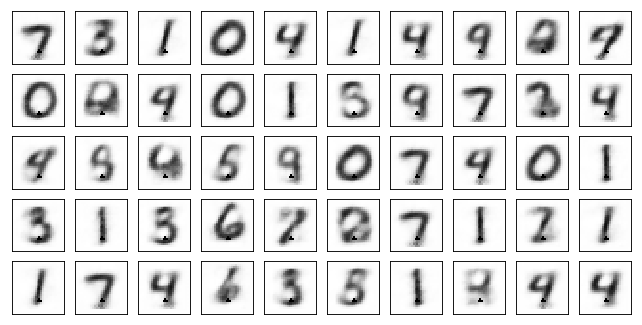

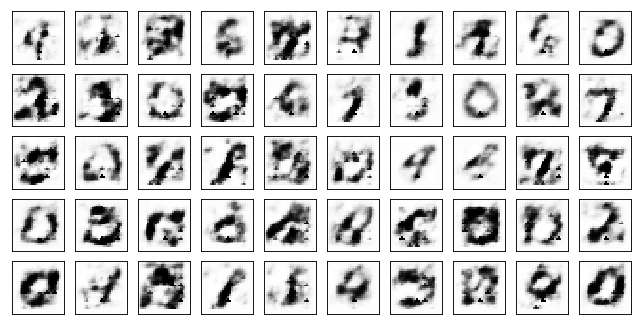

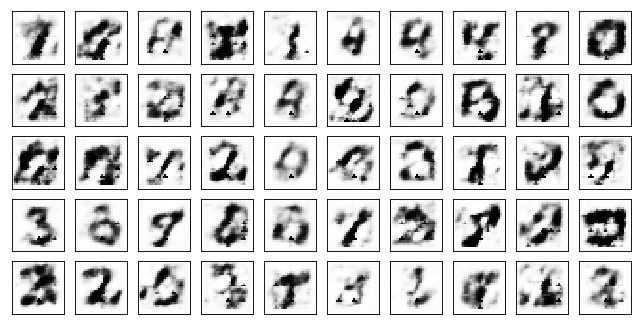

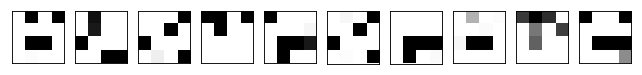

Test losses: 
Adam Discr+bn+dp: 0.87482870 / 4.92262888 / 0.00628544 

Train Epoch: 26 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1406 D:0.0013
Train Epoch: 26 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1183 D:0.0002
Train Epoch: 26 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:0.9893 D:0.0003
Train Epoch: 26 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1065 D:0.0004
Train Epoch: 26 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:0.9993 D:0.0303
Train Epoch: 26 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1080 D:0.0002
Model Adam Discr+bn+dp:


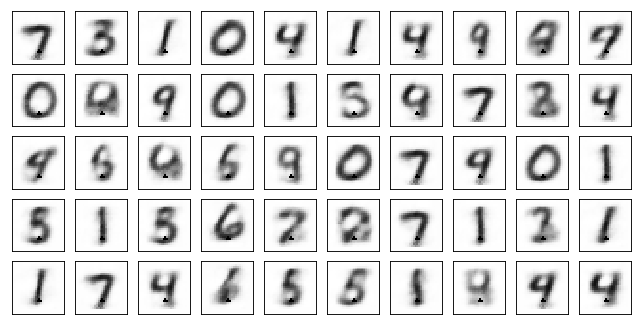

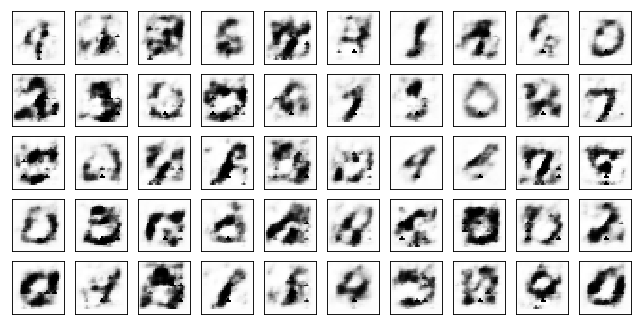

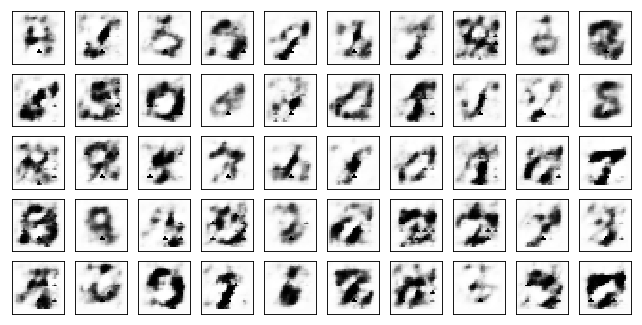

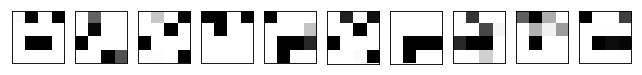

Test losses: 
Adam Discr+bn+dp: 0.86883736 / 4.79820871 / 0.00586465 

Train Epoch: 27 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1056 D:0.0001
Train Epoch: 27 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1014 D:0.0003
Train Epoch: 27 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0628 D:0.0004
Train Epoch: 27 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0996 D:0.0006
Train Epoch: 27 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1046 D:0.0162
Train Epoch: 27 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1122 D:0.0002
Model Adam Discr+bn+dp:


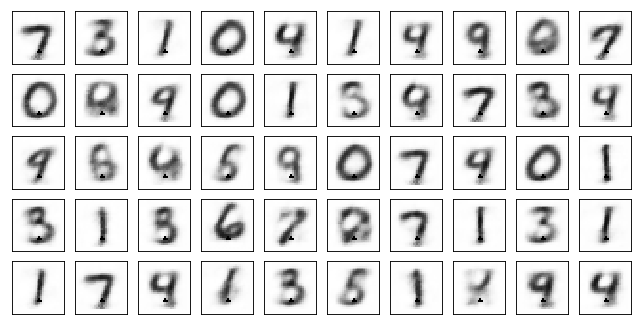

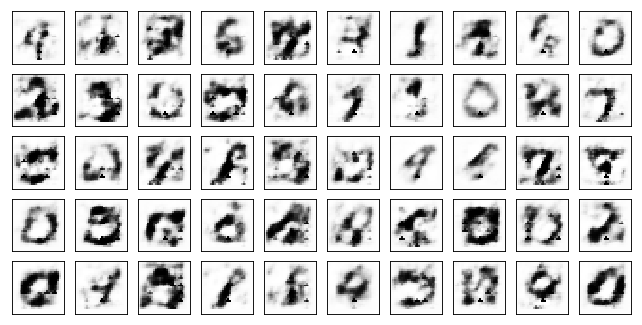

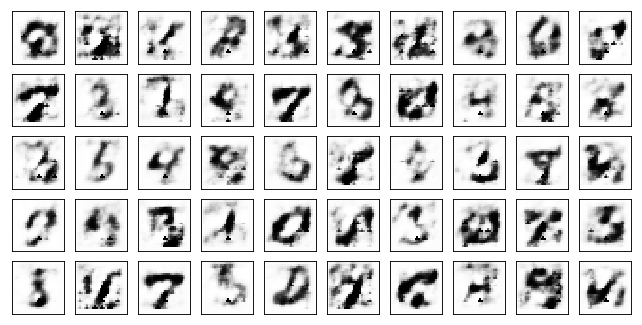

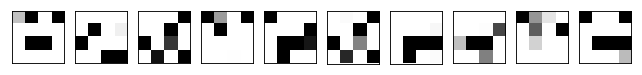

Test losses: 
Adam Discr+bn+dp: 0.85782731 / 4.71985674 / 0.00537572 

Train Epoch: 28 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0679 D:0.0014
Train Epoch: 28 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0831 D:0.0012
Train Epoch: 28 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1026 D:0.0001
Train Epoch: 28 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1031 D:0.0003
Train Epoch: 28 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0622 D:0.0007
Train Epoch: 28 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0546 D:0.0003
Model Adam Discr+bn+dp:


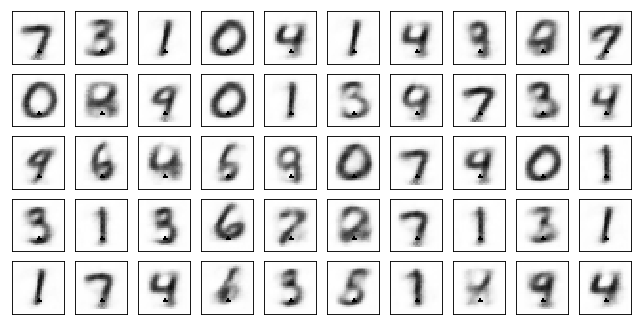

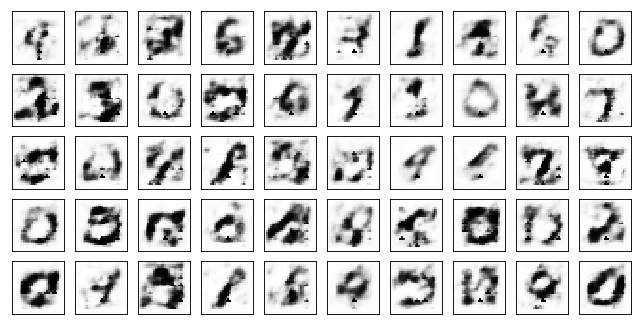

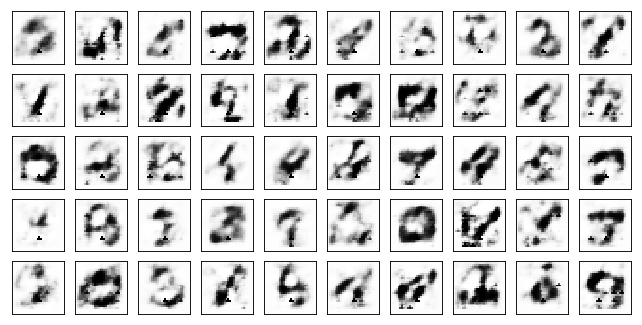

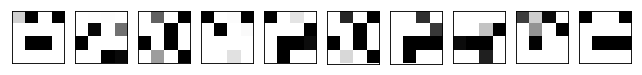

Test losses: 
Adam Discr+bn+dp: 0.85611135 / 4.58448362 / 0.00433984 

Train Epoch: 29 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0952 D:0.0003
Train Epoch: 29 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1612 D:0.0003
Train Epoch: 29 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1448 D:0.0006
Train Epoch: 29 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1376 D:0.0045
Train Epoch: 29 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1358 D:0.0025
Train Epoch: 29 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1387 D:0.0006
Model Adam Discr+bn+dp:


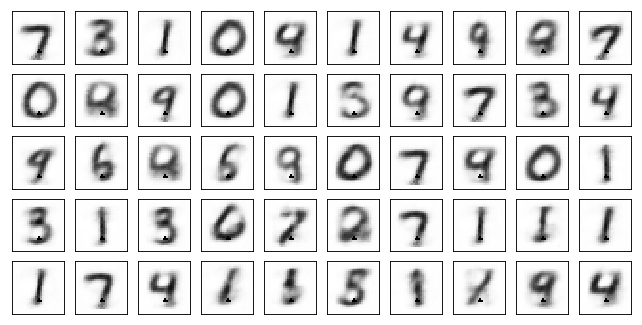

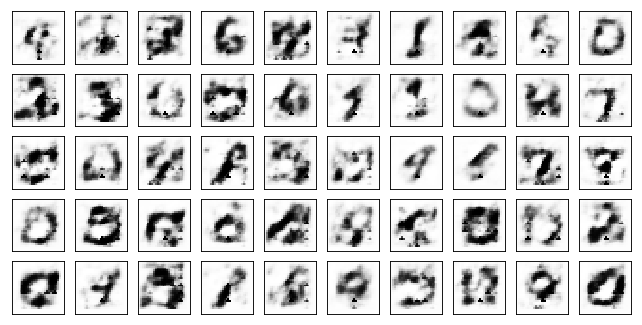

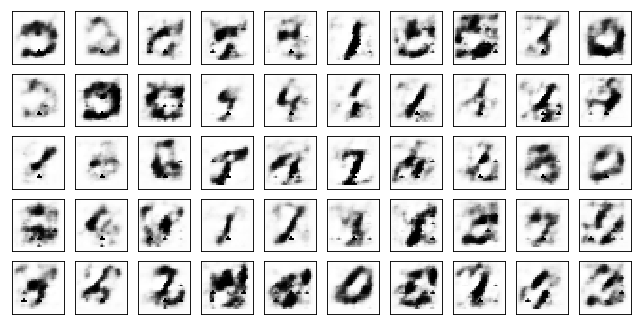

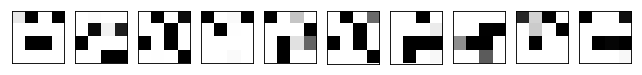

Test losses: 
Adam Discr+bn+dp: 0.85565066 / 4.86849785 / 0.00640049 

Train Epoch: 30 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1608 D:0.0001
Train Epoch: 30 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1208 D:0.0006
Train Epoch: 30 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1416 D:0.0006
Train Epoch: 30 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0644 D:0.0007
Train Epoch: 30 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1530 D:0.0041
Train Epoch: 30 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0980 D:0.0128
Model Adam Discr+bn+dp:


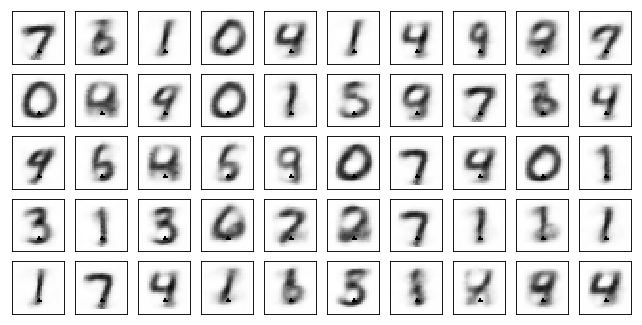

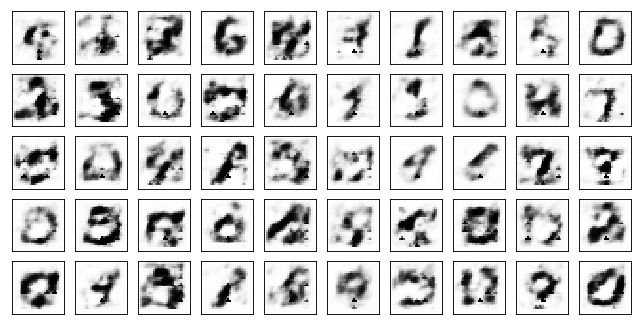

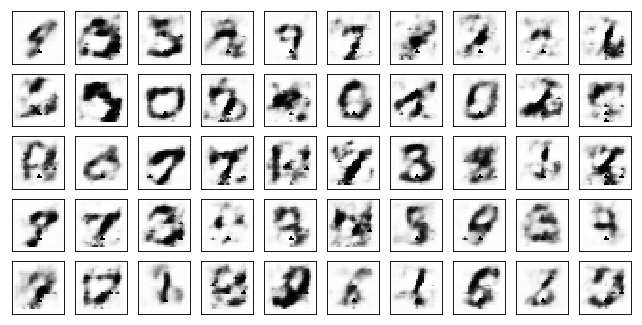

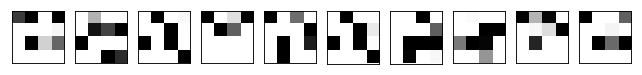

Test losses: 
Adam Discr+bn+dp: 0.86548132 / 4.60164452 / 0.00786432 

Train Epoch: 31 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1022 D:0.0009
Train Epoch: 31 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1181 D:0.0153
Train Epoch: 31 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1170 D:0.0010
Train Epoch: 31 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0634 D:0.0014
Train Epoch: 31 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1448 D:0.0004
Train Epoch: 31 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1604 D:0.0001
Model Adam Discr+bn+dp:


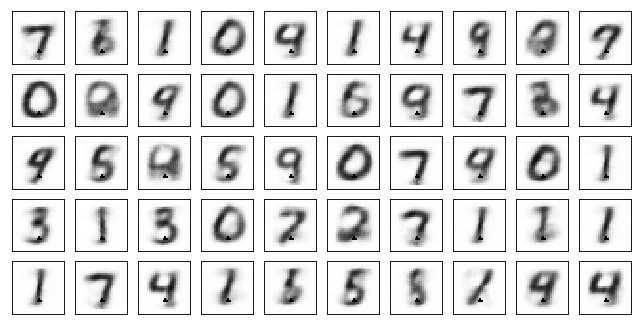

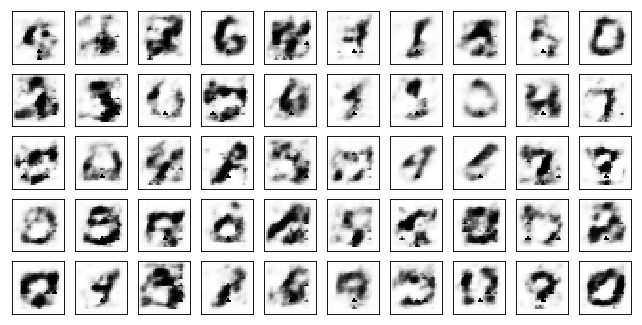

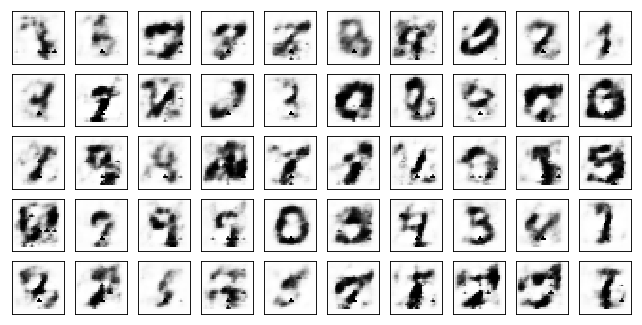

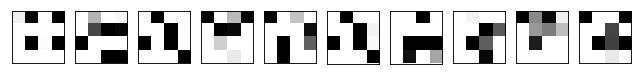

Test losses: 
Adam Discr+bn+dp: 0.87542033 / 4.98384237 / 0.00991593 

Train Epoch: 32 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1660 D:0.0006
Train Epoch: 32 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0708 D:0.0058
Train Epoch: 32 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0416 D:0.0001
Train Epoch: 32 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0508 D:0.0003
Train Epoch: 32 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0274 D:0.0003
Train Epoch: 32 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1346 D:0.0004
Model Adam Discr+bn+dp:


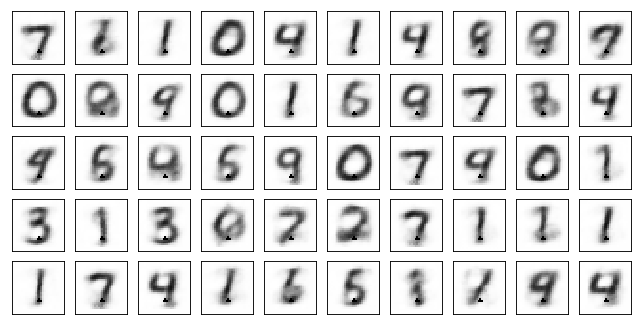

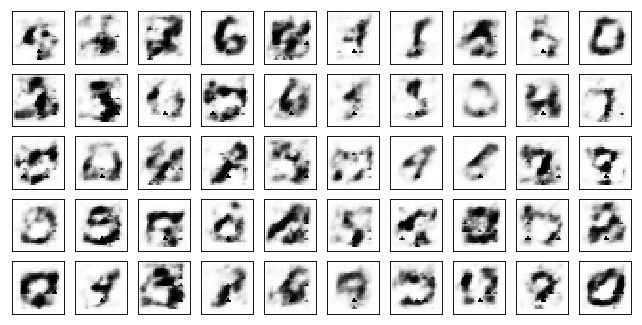

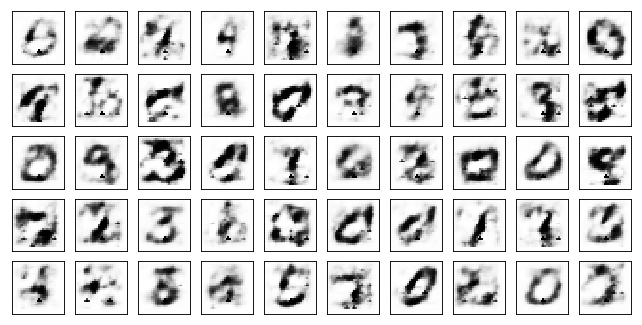

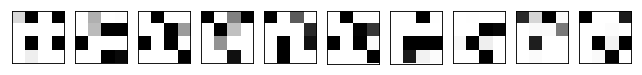

Test losses: 
Adam Discr+bn+dp: 0.87006480 / 4.84838820 / 0.00883498 

Train Epoch: 33 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1531 D:0.0001
Train Epoch: 33 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0913 D:0.0005
Train Epoch: 33 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:0.9984 D:0.0004
Train Epoch: 33 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0745 D:0.0010
Train Epoch: 33 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0833 D:0.0005
Train Epoch: 33 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1237 D:0.0004
Model Adam Discr+bn+dp:


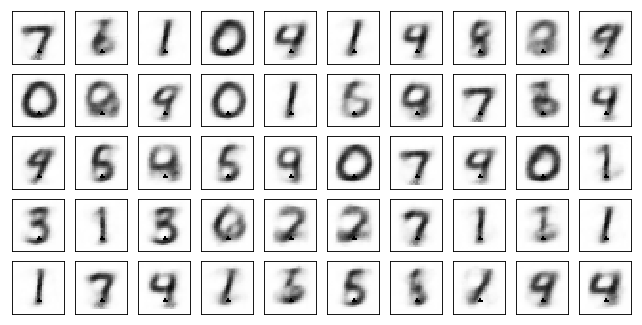

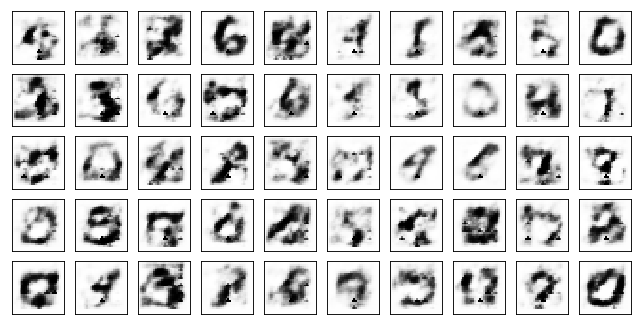

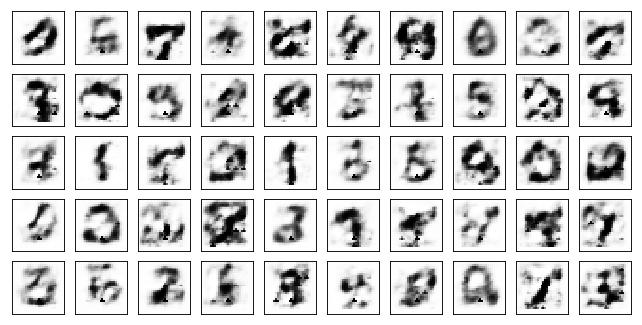

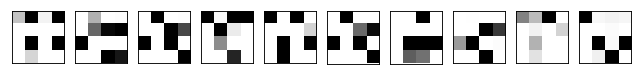

Test losses: 
Adam Discr+bn+dp: 0.86976326 / 4.69963551 / 0.00911610 

Train Epoch: 34 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1053 D:0.0005
Train Epoch: 34 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1111 D:0.0008
Train Epoch: 34 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1519 D:0.0002
Train Epoch: 34 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1351 D:0.0002
Train Epoch: 34 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0575 D:0.0002
Train Epoch: 34 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1356 D:0.0032
Model Adam Discr+bn+dp:


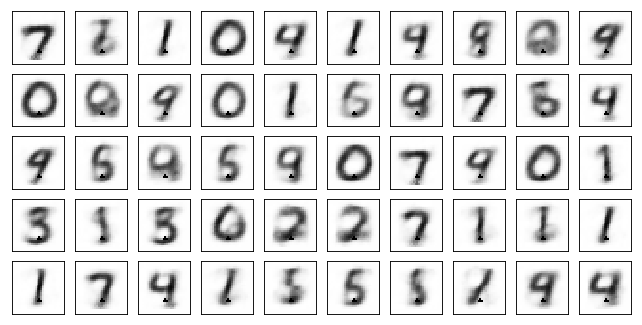

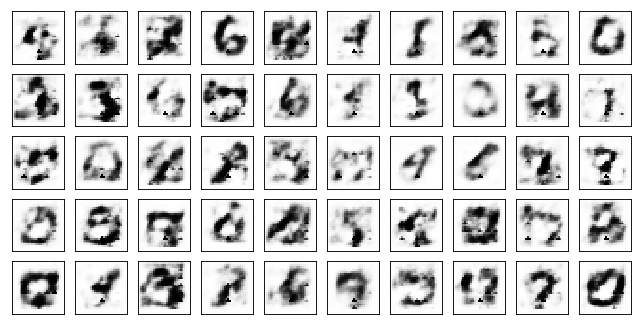

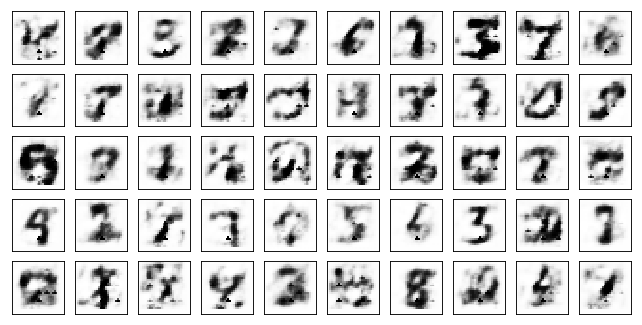

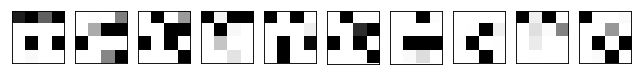

Test losses: 
Adam Discr+bn+dp: 0.86970949 / 4.71572161 / 0.00541799 

Train Epoch: 35 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1029 D:0.0011
Train Epoch: 35 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0995 D:0.0002
Train Epoch: 35 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0770 D:0.0259
Train Epoch: 35 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1089 D:0.0002
Train Epoch: 35 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0775 D:0.0001
Train Epoch: 35 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0856 D:0.0003
Model Adam Discr+bn+dp:


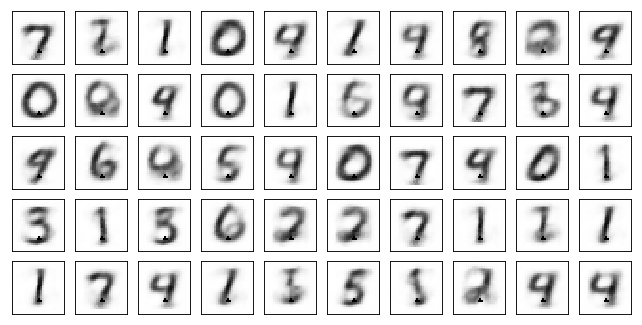

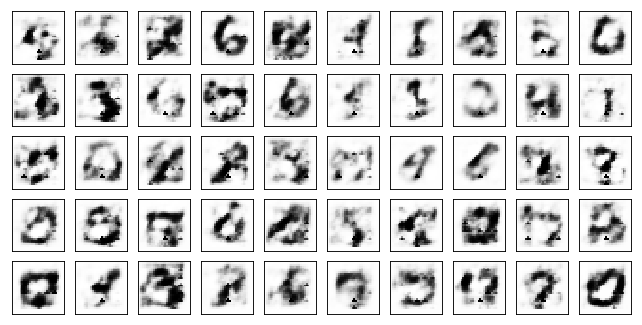

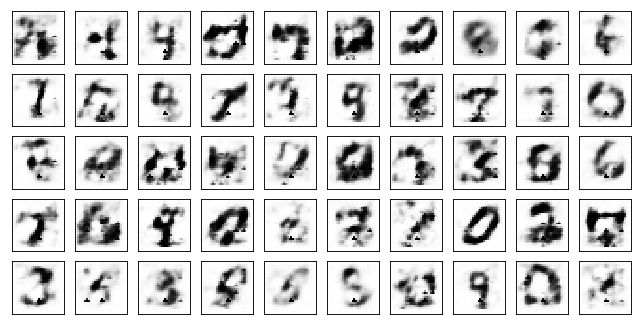

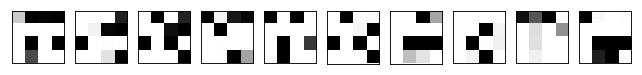

Test losses: 
Adam Discr+bn+dp: 0.86792445 / 4.58627892 / 0.00489196 

Train Epoch: 36 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0642 D:0.0004
Train Epoch: 36 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1715 D:0.0003
Train Epoch: 36 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0325 D:0.0008
Train Epoch: 36 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0485 D:0.0003
Train Epoch: 36 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1438 D:0.0004
Train Epoch: 36 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1046 D:0.0004
Model Adam Discr+bn+dp:


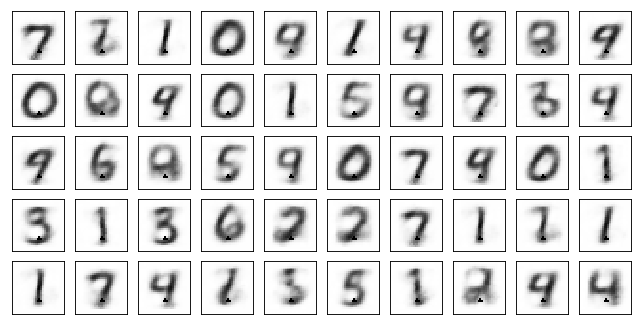

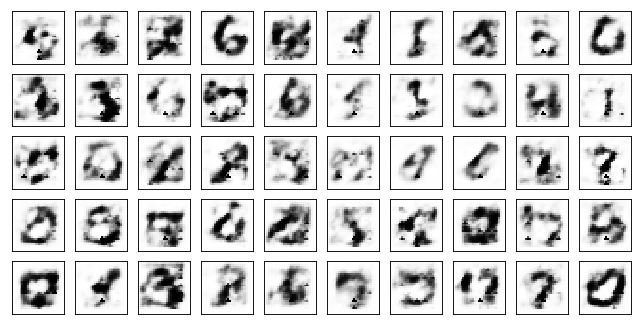

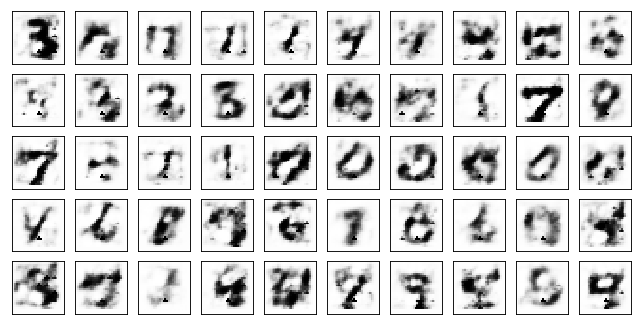

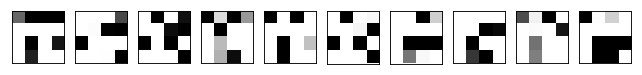

Test losses: 
Adam Discr+bn+dp: 0.85728639 / 4.75562191 / 0.00733829 

Train Epoch: 37 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1401 D:0.0009
Train Epoch: 37 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1267 D:0.0002
Train Epoch: 37 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0076 D:0.0002
Train Epoch: 37 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1171 D:0.0002
Train Epoch: 37 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0947 D:0.0002
Train Epoch: 37 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1265 D:0.0002
Model Adam Discr+bn+dp:


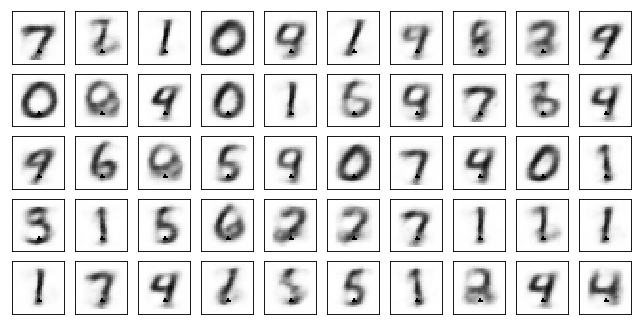

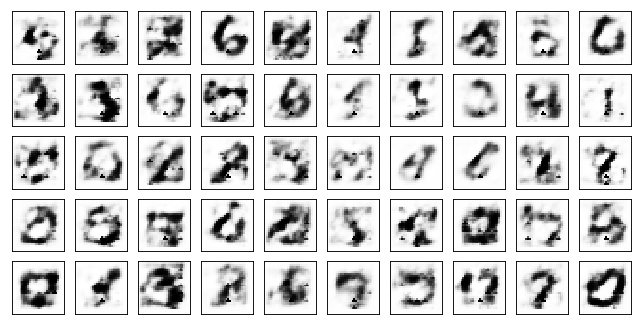

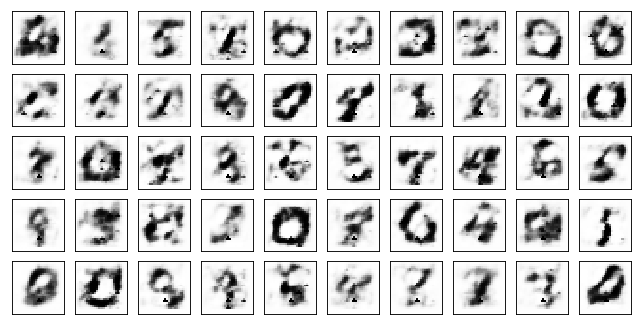

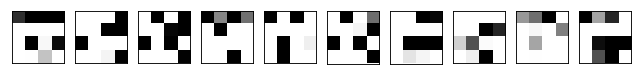

Test losses: 
Adam Discr+bn+dp: 0.85406220 / 4.67498970 / 0.00697284 

Train Epoch: 38 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0429 D:0.0001
Train Epoch: 38 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0614 D:0.0003
Train Epoch: 38 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0424 D:0.0003
Train Epoch: 38 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1462 D:0.0002
Train Epoch: 38 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0971 D:0.0003
Train Epoch: 38 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1583 D:0.0001
Model Adam Discr+bn+dp:


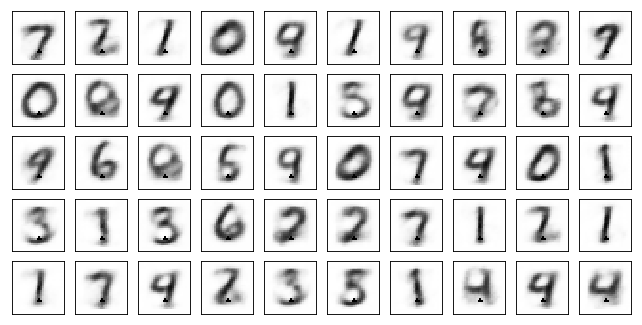

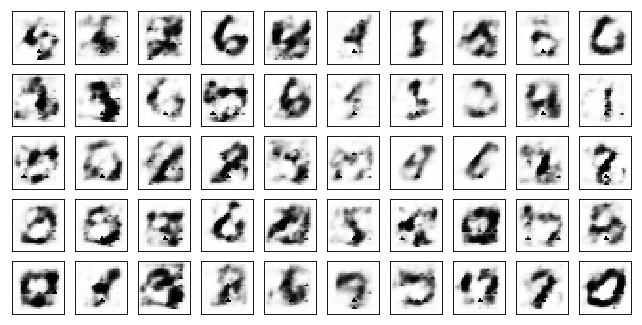

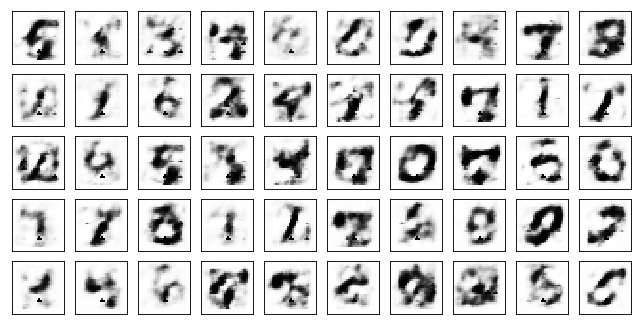

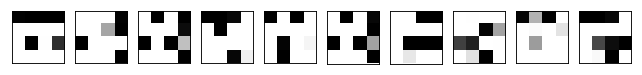

Test losses: 
Adam Discr+bn+dp: 0.84566587 / 4.85116625 / 0.00483351 

Train Epoch: 39 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1110 D:0.0002
Train Epoch: 39 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1331 D:0.0014
Train Epoch: 39 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0359 D:0.0004
Train Epoch: 39 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1385 D:0.0129
Train Epoch: 39 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1194 D:0.0002
Train Epoch: 39 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1108 D:0.0001
Model Adam Discr+bn+dp:


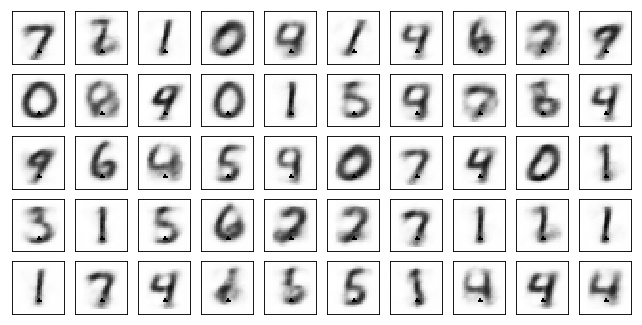

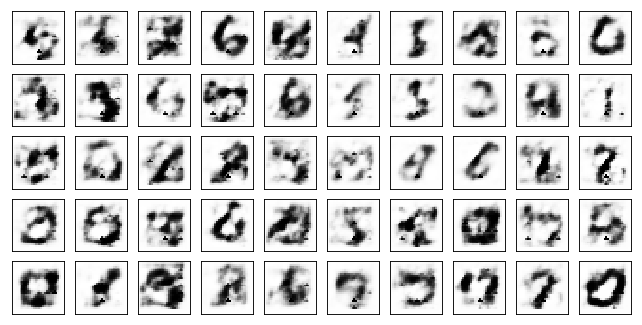

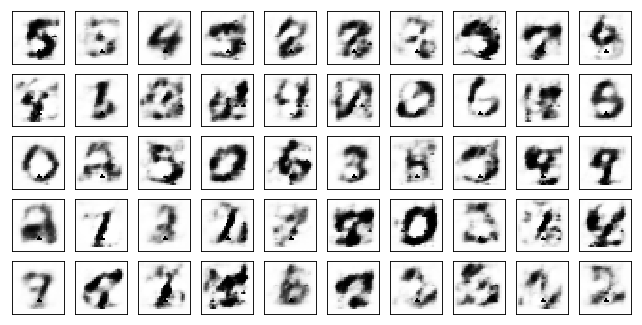

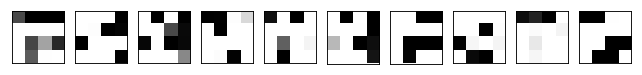

Test losses: 
Adam Discr+bn+dp: 0.83524919 / 4.80456781 / 0.00849506 

Train Epoch: 40 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1350 D:0.1150
Train Epoch: 40 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0222 D:0.0008
Train Epoch: 40 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1577 D:0.0004
Train Epoch: 40 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1145 D:0.0004
Train Epoch: 40 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1031 D:0.0037
Train Epoch: 40 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1214 D:0.0002
Model Adam Discr+bn+dp:


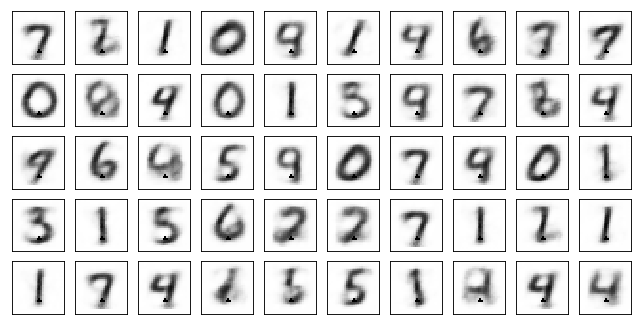

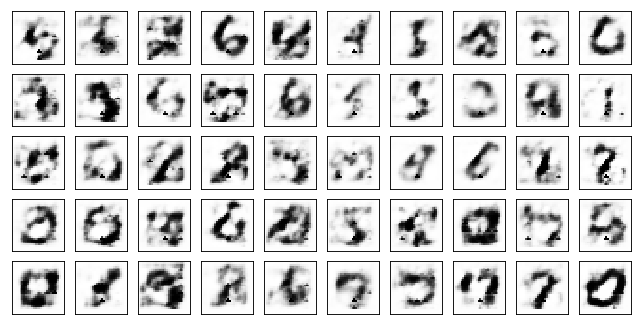

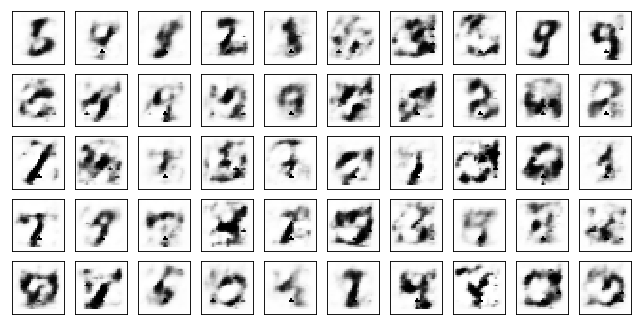

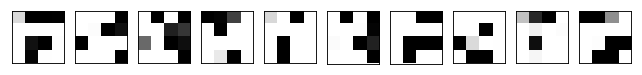

Test losses: 
Adam Discr+bn+dp: 0.82575279 / 4.80092335 / 0.00608993 

Train Epoch: 41 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1771 D:0.0003
Train Epoch: 41 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1072 D:0.0003
Train Epoch: 41 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0481 D:0.0018
Train Epoch: 41 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0637 D:0.0004
Train Epoch: 41 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0850 D:0.0004
Train Epoch: 41 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1622 D:0.0002
Model Adam Discr+bn+dp:


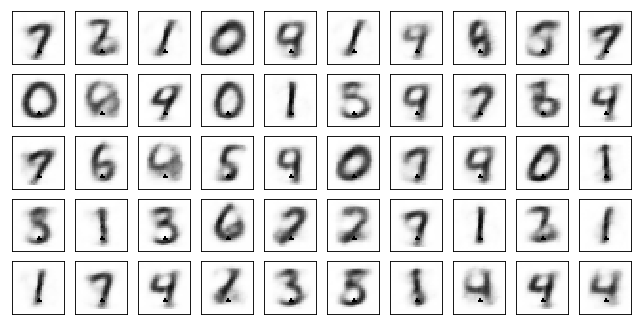

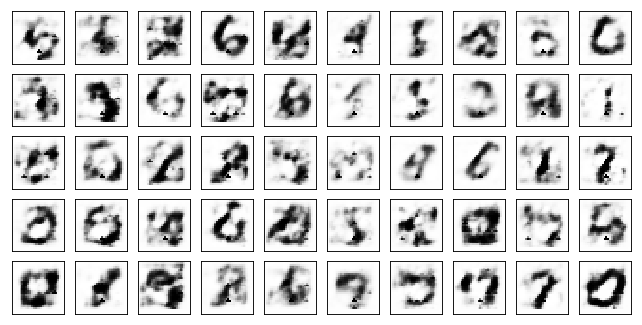

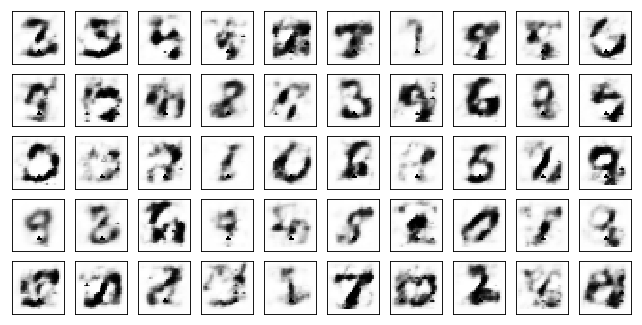

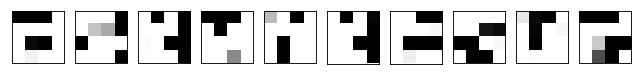

Test losses: 
Adam Discr+bn+dp: 0.82676393 / 4.84035397 / 0.00542645 

Train Epoch: 42 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1446 D:0.0005
Train Epoch: 42 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1341 D:0.0001
Train Epoch: 42 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0911 D:0.0002
Train Epoch: 42 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1520 D:0.0002
Train Epoch: 42 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1056 D:0.0118
Train Epoch: 42 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1212 D:0.0003
Model Adam Discr+bn+dp:


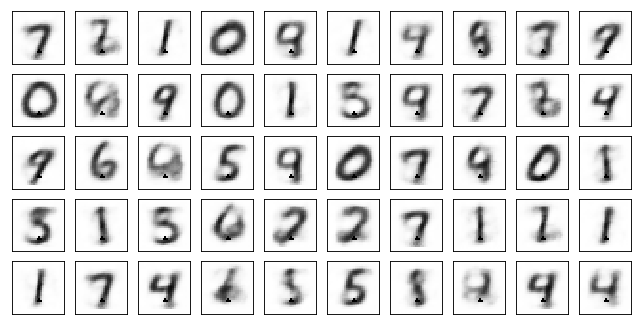

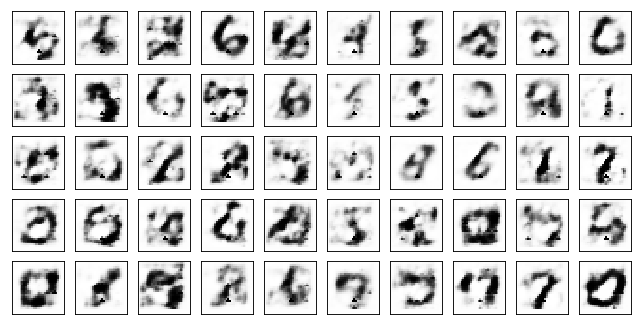

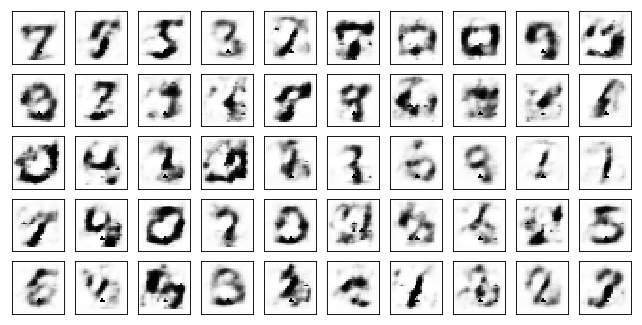

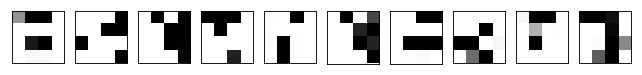

Test losses: 
Adam Discr+bn+dp: 0.81882674 / 4.76556349 / 0.00597654 

Train Epoch: 43 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1691 D:0.0003
Train Epoch: 43 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1484 D:0.0001
Train Epoch: 43 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1661 D:0.0002
Train Epoch: 43 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1446 D:0.0001
Train Epoch: 43 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0821 D:0.0003
Train Epoch: 43 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1939 D:0.0002
Model Adam Discr+bn+dp:


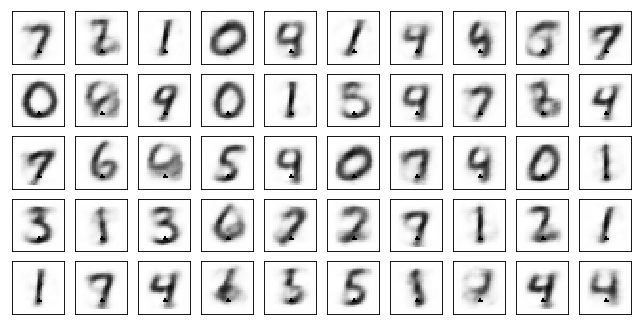

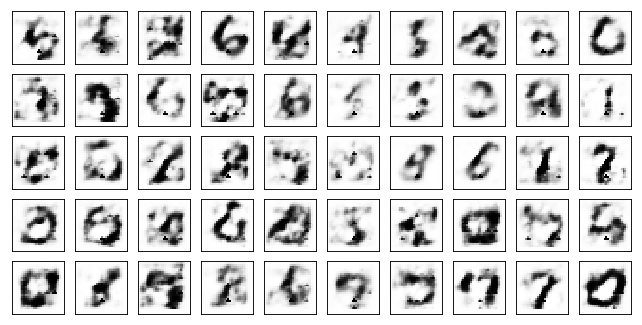

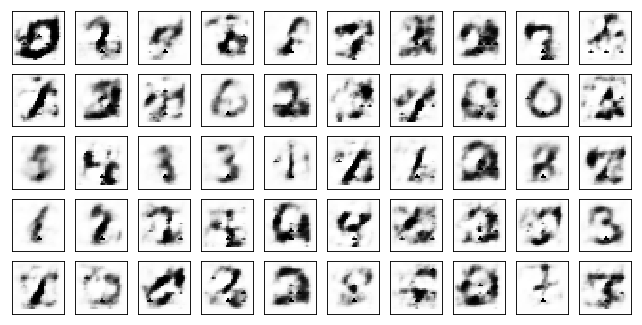

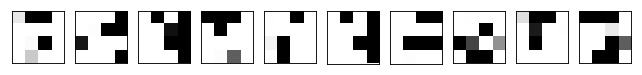

Test losses: 
Adam Discr+bn+dp: 0.81477851 / 4.89186144 / 0.00607644 

Train Epoch: 44 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1399 D:0.0009
Train Epoch: 44 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1025 D:0.0001
Train Epoch: 44 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0918 D:0.0006
Train Epoch: 44 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0314 D:0.0006
Train Epoch: 44 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0847 D:0.0002
Train Epoch: 44 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1291 D:0.0007
Model Adam Discr+bn+dp:


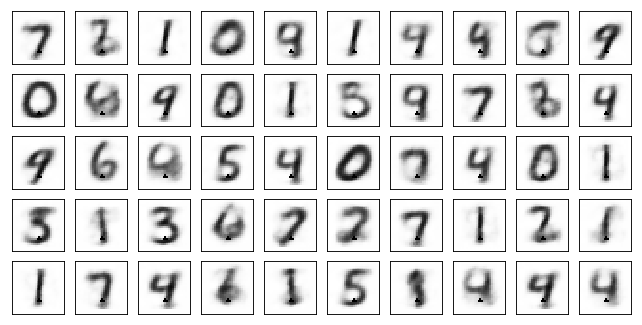

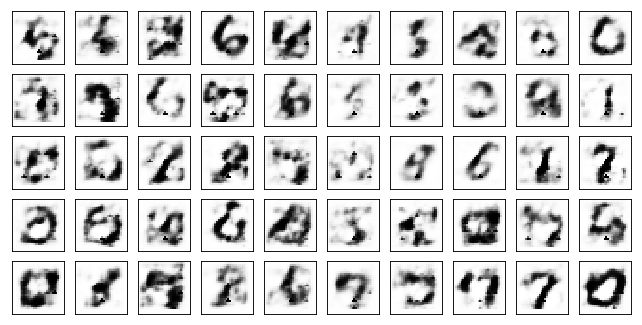

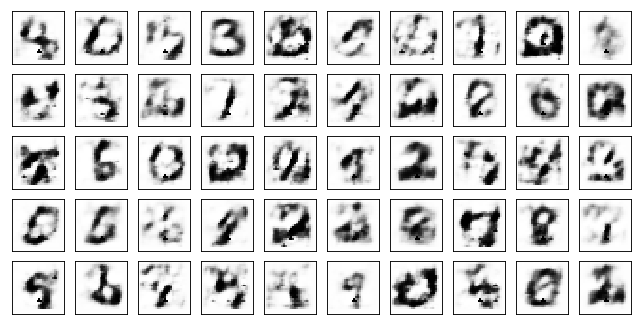

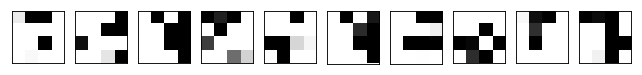

Test losses: 
Adam Discr+bn+dp: 0.81008911 / 4.74662828 / 0.00530010 

Train Epoch: 45 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0994 D:0.0006
Train Epoch: 45 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1082 D:0.0006
Train Epoch: 45 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1215 D:0.0001
Train Epoch: 45 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0533 D:0.0006
Train Epoch: 45 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1262 D:0.0003
Train Epoch: 45 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1373 D:0.0010
Model Adam Discr+bn+dp:


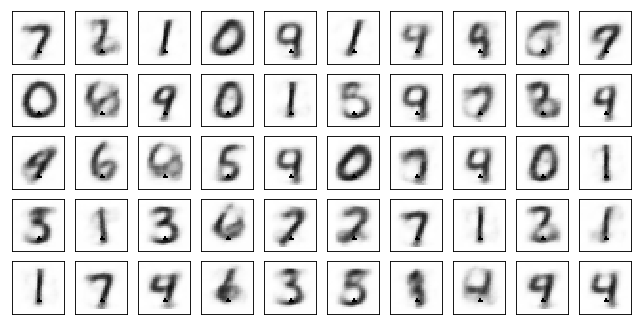

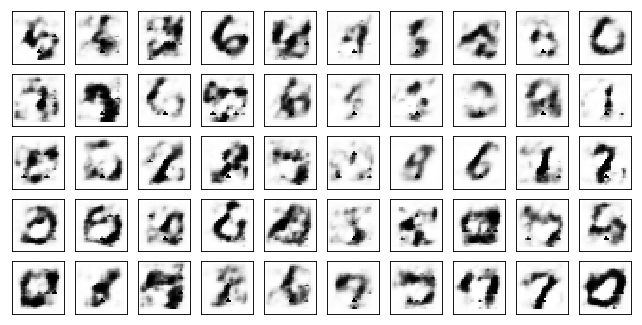

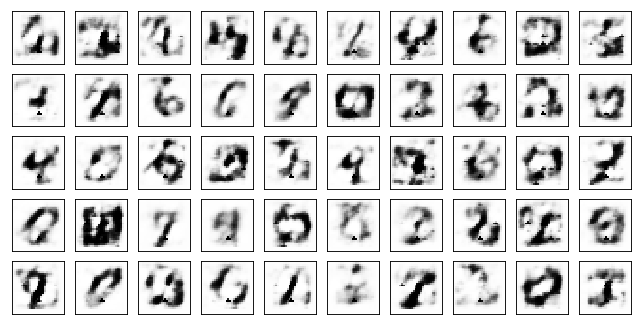

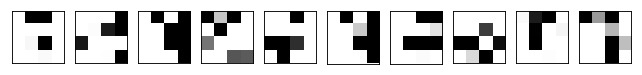

Test losses: 
Adam Discr+bn+dp: 0.80321729 / 4.70931625 / 0.00148746 

Train Epoch: 46 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0865 D:0.0002
Train Epoch: 46 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0488 D:0.0014
Train Epoch: 46 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0975 D:0.0005
Train Epoch: 46 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0860 D:0.0002
Train Epoch: 46 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0419 D:0.0001
Train Epoch: 46 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1789 D:0.0059
Model Adam Discr+bn+dp:


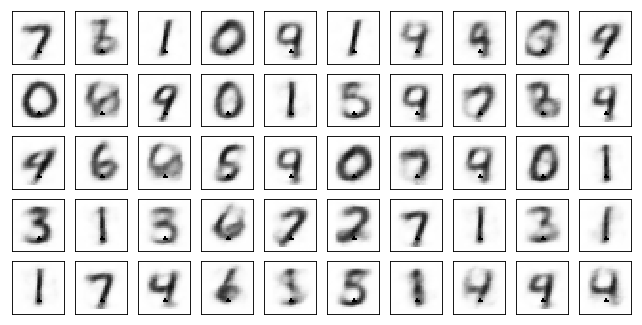

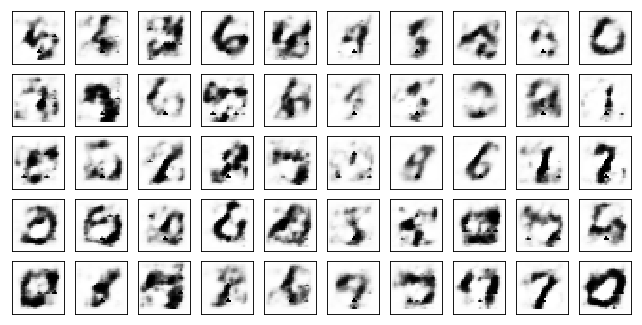

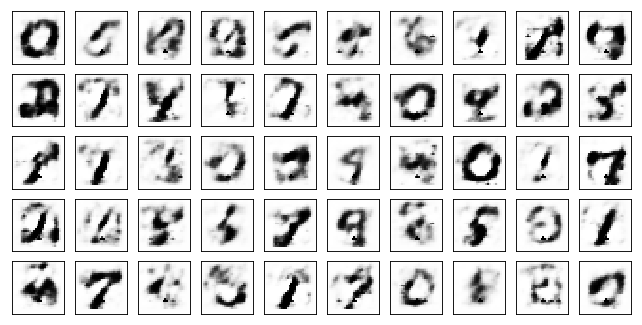

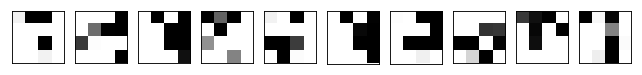

Test losses: 
Adam Discr+bn+dp: 0.80182505 / 5.03871918 / 0.00732212 

Train Epoch: 47 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1701 D:0.0003
Train Epoch: 47 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1446 D:0.0003
Train Epoch: 47 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1176 D:0.0003
Train Epoch: 47 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1990 D:0.0001
Train Epoch: 47 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1851 D:0.0001
Train Epoch: 47 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1702 D:0.0001
Model Adam Discr+bn+dp:


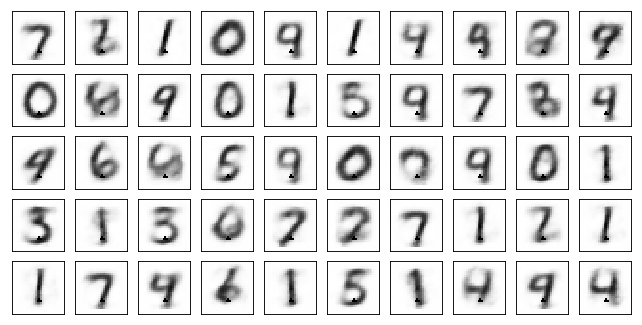

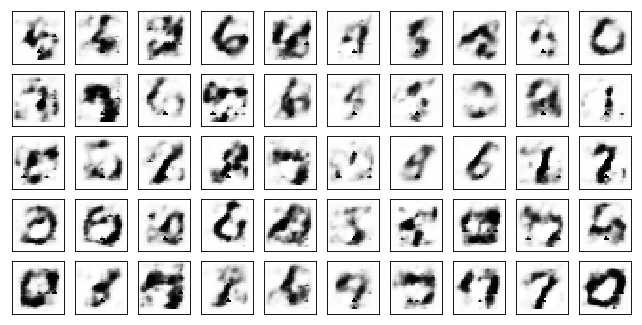

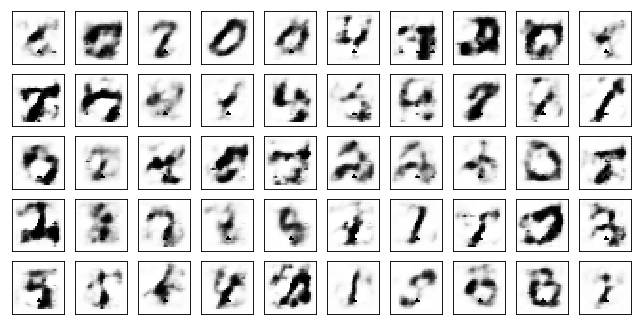

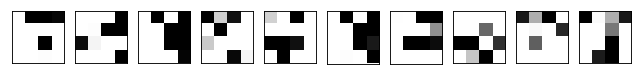

Test losses: 
Adam Discr+bn+dp: 0.79615074 / 4.86716652 / 0.00383665 

Train Epoch: 48 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0941 D:0.0002
Train Epoch: 48 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1004 D:0.0012
Train Epoch: 48 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0619 D:0.0001
Train Epoch: 48 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1456 D:0.0001
Train Epoch: 48 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1336 D:0.0003
Train Epoch: 48 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1129 D:0.0006
Model Adam Discr+bn+dp:


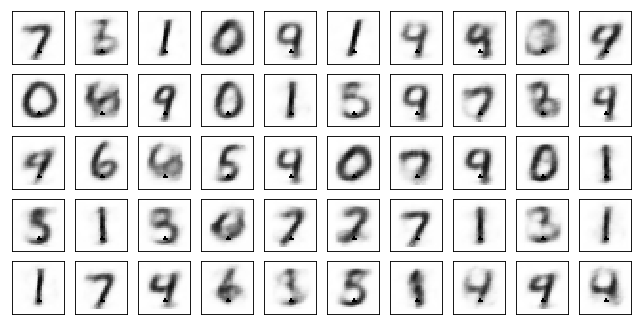

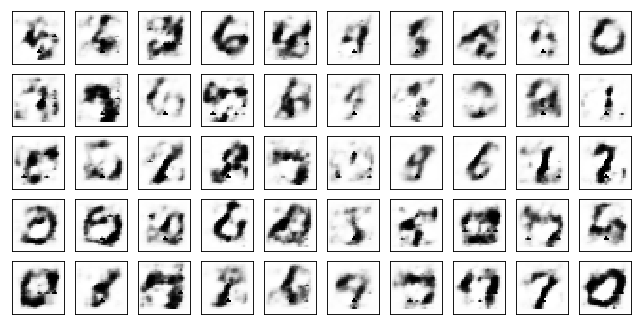

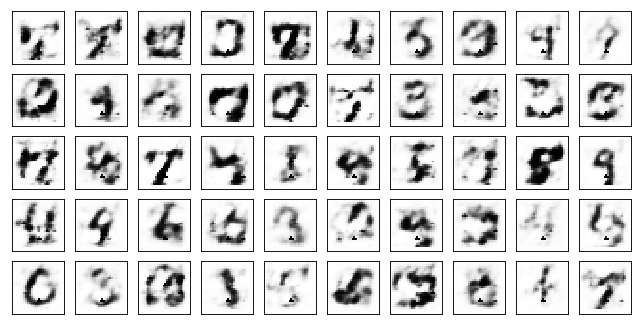

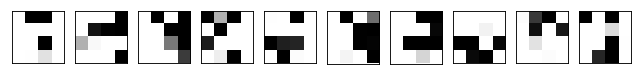

Test losses: 
Adam Discr+bn+dp: 0.79868811 / 4.72986078 / 0.00476402 

Train Epoch: 49 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1372 D:0.0004
Train Epoch: 49 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1100 D:0.0002
Train Epoch: 49 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1337 D:0.0002
Train Epoch: 49 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1212 D:0.0006
Train Epoch: 49 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0812 D:0.0010
Train Epoch: 49 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0512 D:0.0002
Model Adam Discr+bn+dp:


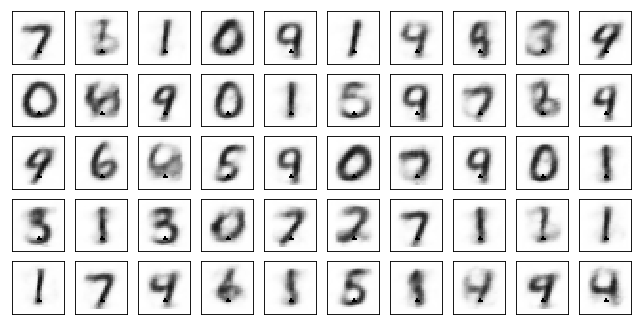

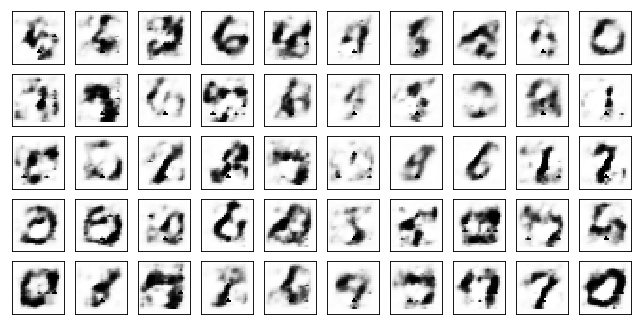

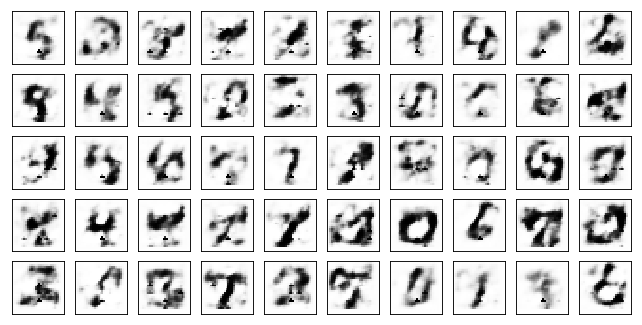

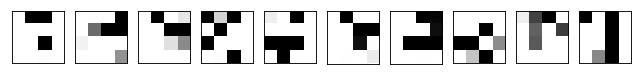

Test losses: 
Adam Discr+bn+dp: 0.80289942 / 4.68890333 / 0.00405038 

Train Epoch: 50 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1049 D:0.0001
Train Epoch: 50 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1157 D:0.0003
Train Epoch: 50 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0436 D:0.0004
Train Epoch: 50 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0571 D:0.0005
Train Epoch: 50 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0835 D:0.0010
Train Epoch: 50 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0373 D:0.0003
Model Adam Discr+bn+dp:


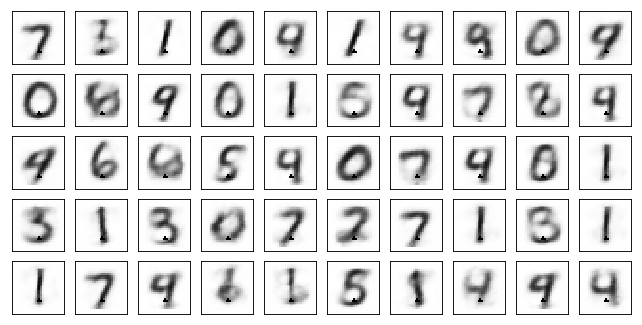

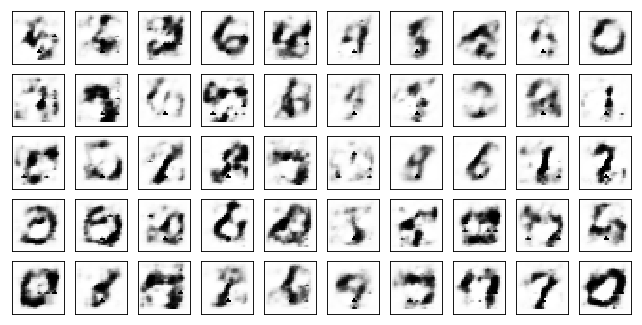

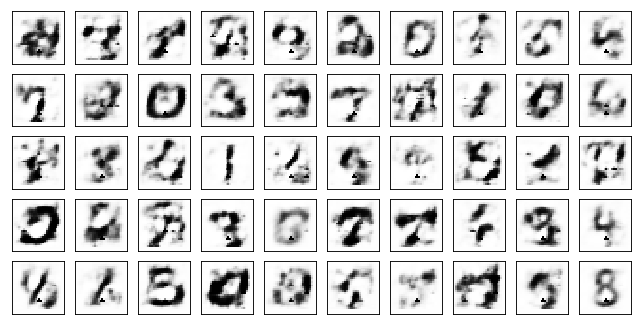

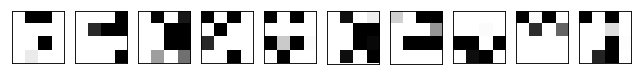

Test losses: 
Adam Discr+bn+dp: 0.79222929 / 4.53011990 / 0.00262863 

Train Epoch: 51 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0989 D:0.0006
Train Epoch: 51 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1165 D:0.0002
Train Epoch: 51 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0989 D:0.0005
Train Epoch: 51 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0820 D:0.0002
Train Epoch: 51 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0949 D:0.0004
Train Epoch: 51 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.0852 D:0.0006
Model Adam Discr+bn+dp:


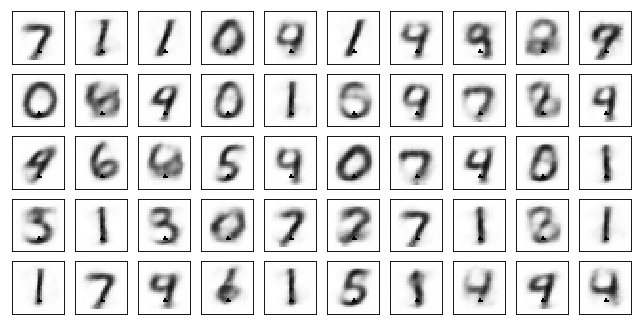

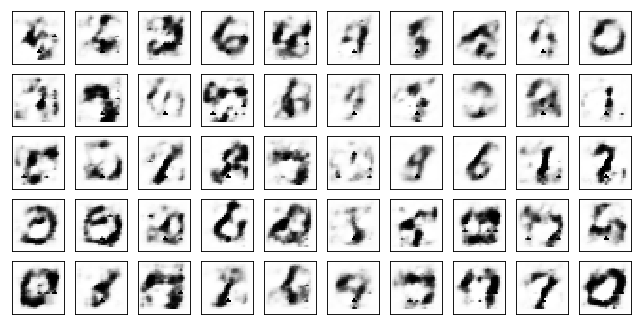

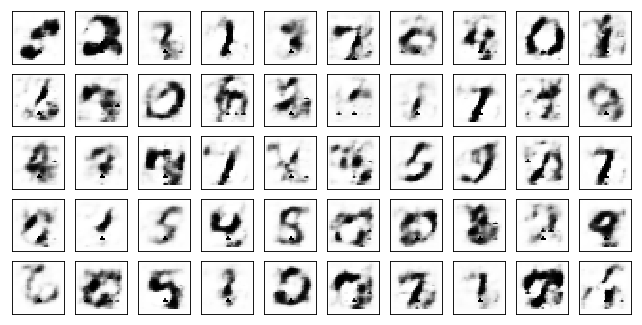

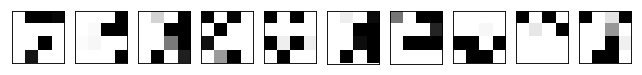

Test losses: 
Adam Discr+bn+dp: 0.78946525 / 4.65529490 / 0.00262369 

Train Epoch: 52 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0875 D:0.0001
Train Epoch: 52 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1683 D:0.0002
Train Epoch: 52 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0539 D:0.0007
Train Epoch: 52 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0272 D:0.0003
Train Epoch: 52 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1354 D:0.0005
Train Epoch: 52 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1145 D:0.0009
Model Adam Discr+bn+dp:


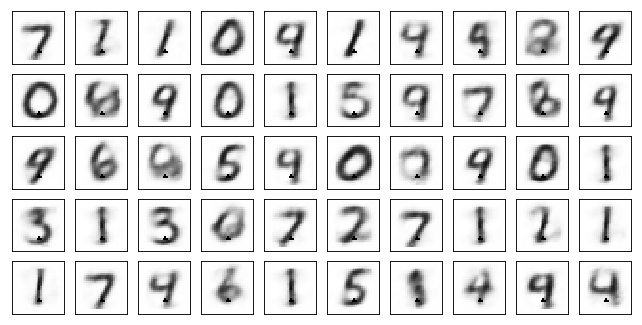

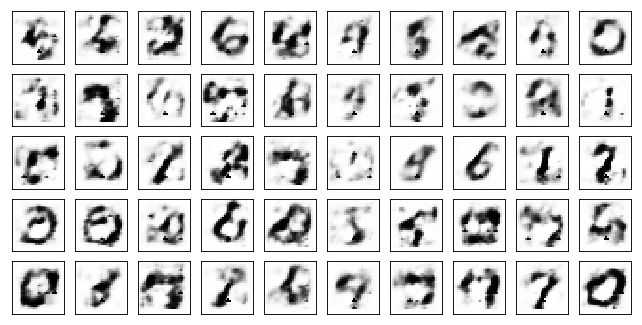

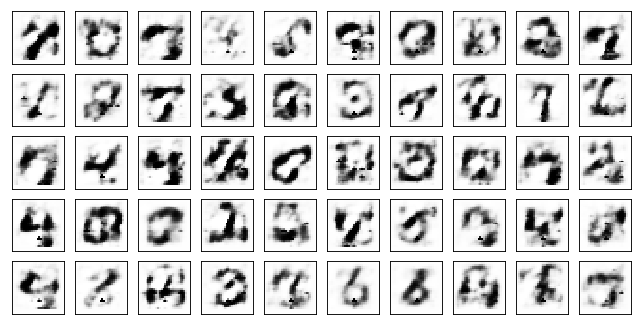

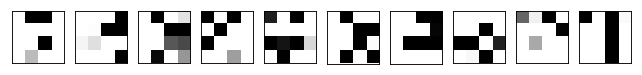

Test losses: 
Adam Discr+bn+dp: 0.79101318 / 4.74277925 / 0.00286751 

Train Epoch: 53 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.0706 D:0.0002
Train Epoch: 53 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1416 D:0.0003
Train Epoch: 53 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1843 D:0.0001
Train Epoch: 53 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1014 D:0.0003
Train Epoch: 53 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0578 D:0.0004
Train Epoch: 53 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1318 D:0.0003
Model Adam Discr+bn+dp:


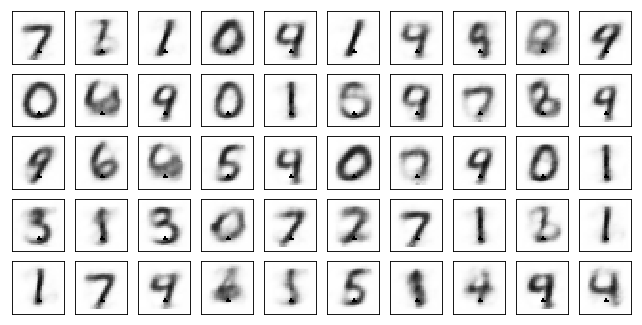

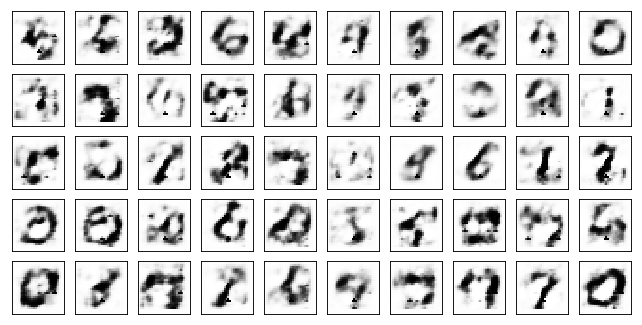

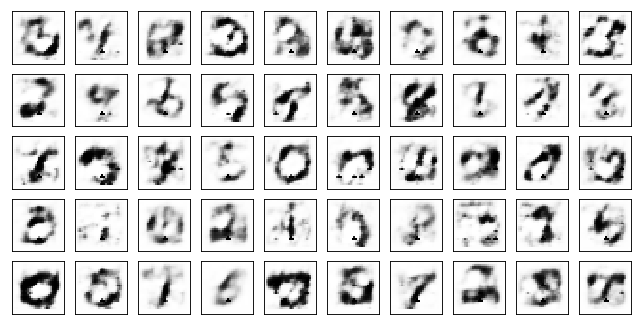

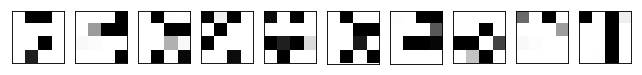

Test losses: 
Adam Discr+bn+dp: 0.78788596 / 4.85572100 / 0.00392735 

Train Epoch: 54 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1551 D:0.0002
Train Epoch: 54 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.0951 D:0.0002
Train Epoch: 54 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1451 D:0.0001
Train Epoch: 54 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1146 D:0.0004
Train Epoch: 54 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1187 D:0.0003
Train Epoch: 54 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.2154 D:0.0002
Model Adam Discr+bn+dp:


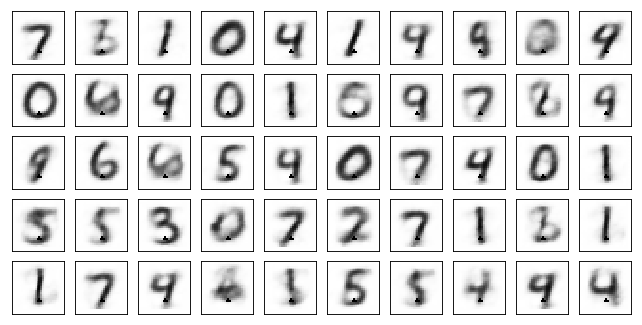

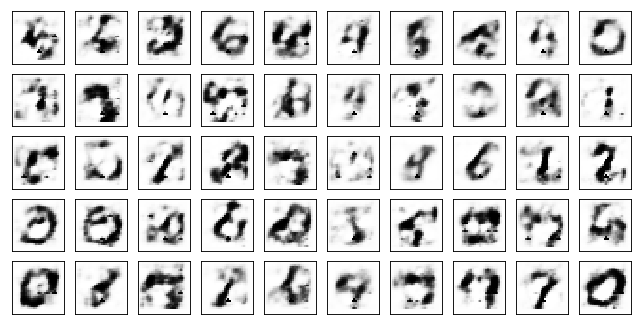

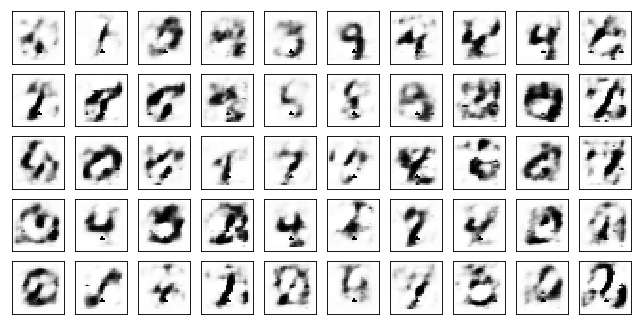

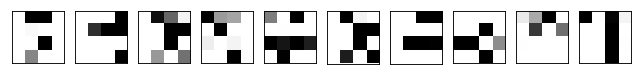

Test losses: 
Adam Discr+bn+dp: 0.78526747 / 5.16301632 / 0.00499396 

Train Epoch: 55 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.2351 D:0.0001
Train Epoch: 55 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1514 D:0.0032
Train Epoch: 55 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1439 D:0.0001
Train Epoch: 55 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1539 D:0.0002
Train Epoch: 55 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1168 D:0.0003
Train Epoch: 55 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1329 D:0.0002
Model Adam Discr+bn+dp:


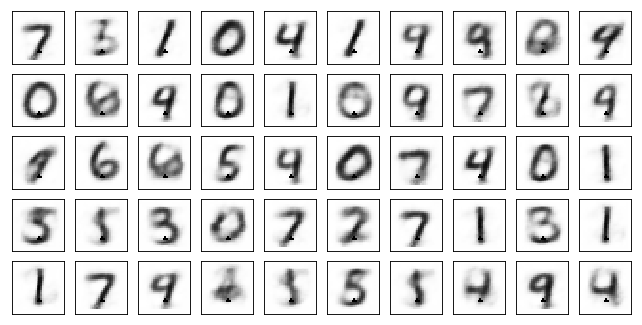

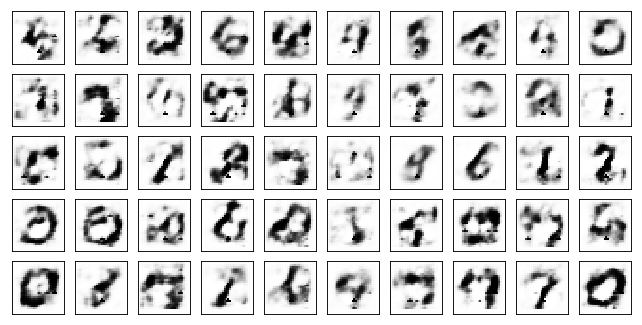

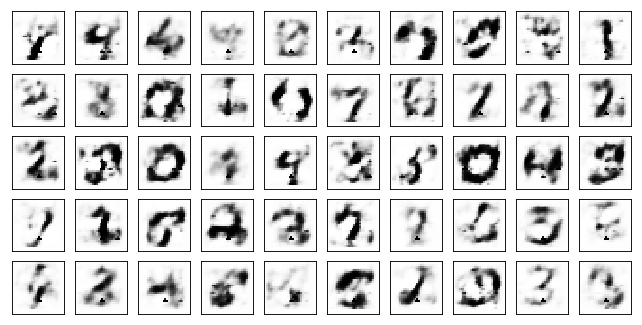

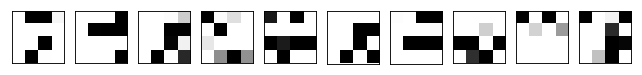

Test losses: 
Adam Discr+bn+dp: 0.78395820 / 4.95928669 / 0.00530403 

Train Epoch: 56 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1418 D:0.0002
Train Epoch: 56 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1149 D:0.0002
Train Epoch: 56 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1638 D:0.0001
Train Epoch: 56 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.2064 D:0.0001
Train Epoch: 56 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.2013 D:0.0001
Train Epoch: 56 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1486 D:0.0024
Model Adam Discr+bn+dp:


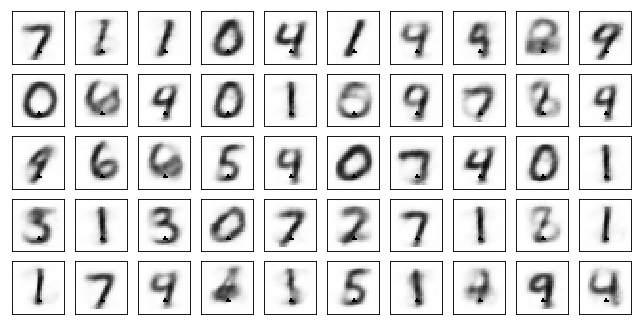

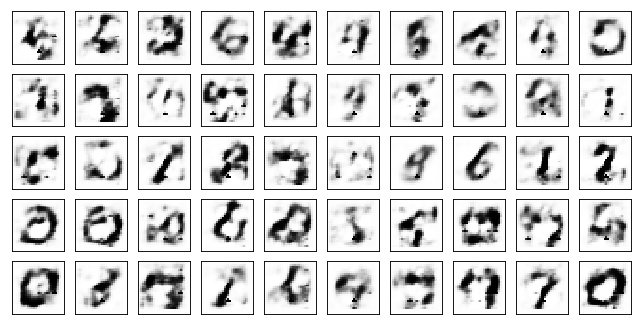

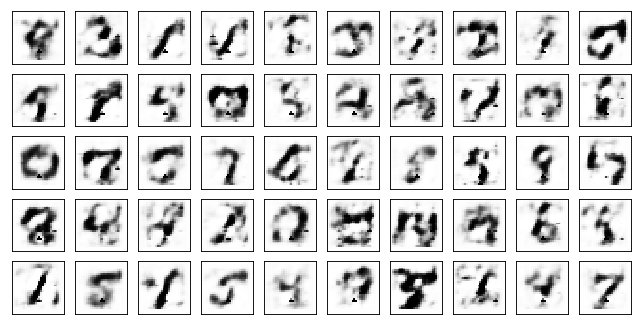

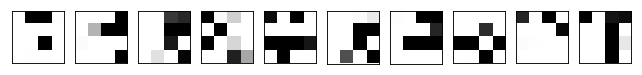

Test losses: 
Adam Discr+bn+dp: 0.78296733 / 5.06845045 / 0.00310925 

Train Epoch: 57 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1921 D:0.0000
Train Epoch: 57 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1480 D:0.0001
Train Epoch: 57 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1033 D:0.0003
Train Epoch: 57 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0431 D:0.0004
Train Epoch: 57 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1499 D:0.0005
Train Epoch: 57 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1244 D:0.0001
Model Adam Discr+bn+dp:


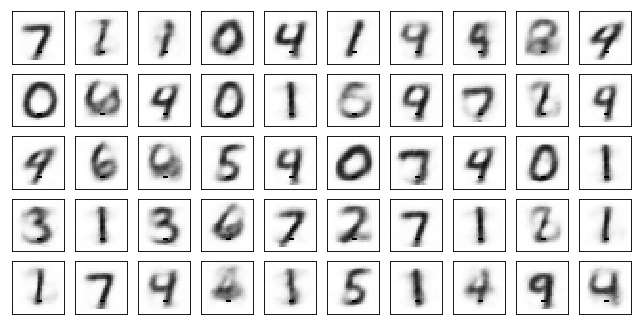

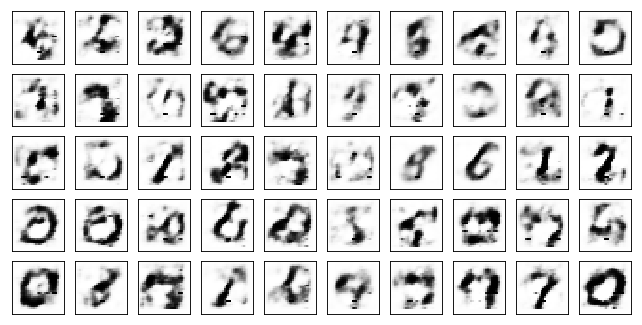

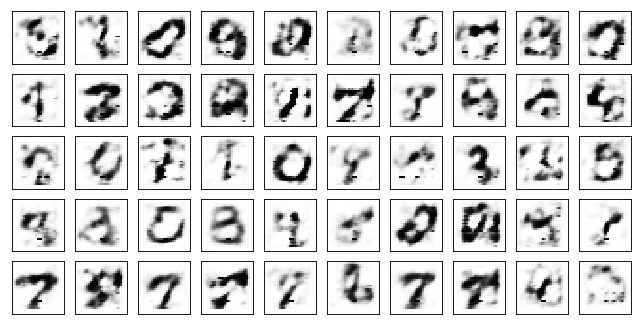

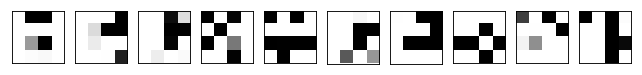

Test losses: 
Adam Discr+bn+dp: 0.77440315 / 5.22077036 / 0.00342579 

Train Epoch: 58 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1752 D:0.0001
Train Epoch: 58 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1601 D:0.0006
Train Epoch: 58 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1584 D:0.0001
Train Epoch: 58 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1819 D:0.0001
Train Epoch: 58 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1665 D:0.0001
Train Epoch: 58 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1220 D:0.0003
Model Adam Discr+bn+dp:


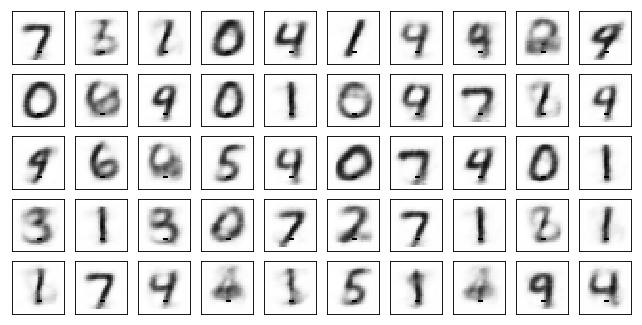

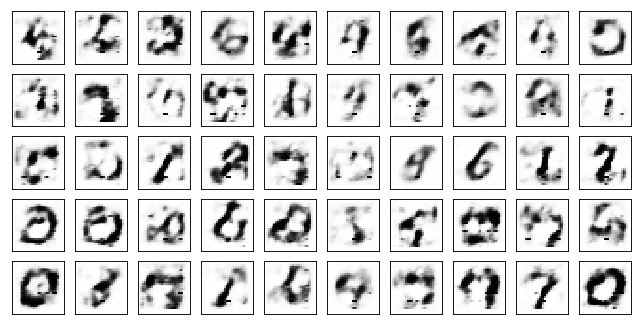

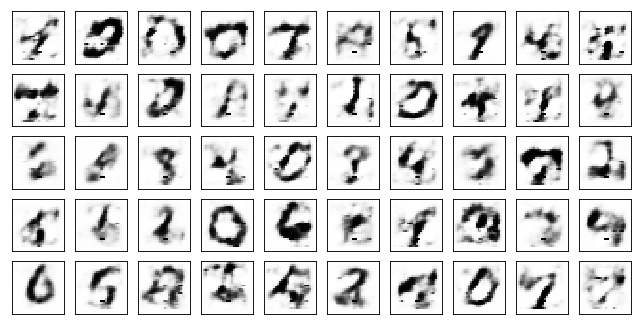

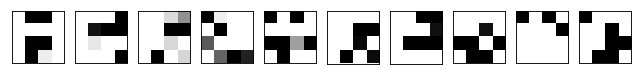

Test losses: 
Adam Discr+bn+dp: 0.77492505 / 4.94101524 / 0.00208170 

Train Epoch: 59 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1492 D:0.0002
Train Epoch: 59 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1573 D:0.0008
Train Epoch: 59 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1375 D:0.0001
Train Epoch: 59 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1191 D:0.0002
Train Epoch: 59 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1614 D:0.0001
Train Epoch: 59 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1350 D:0.0002
Model Adam Discr+bn+dp:


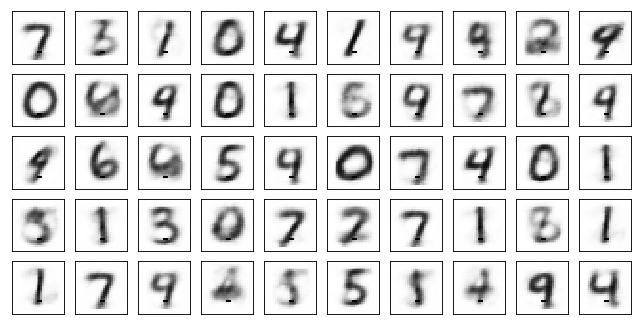

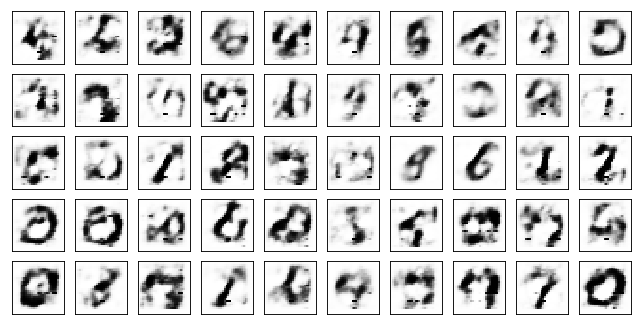

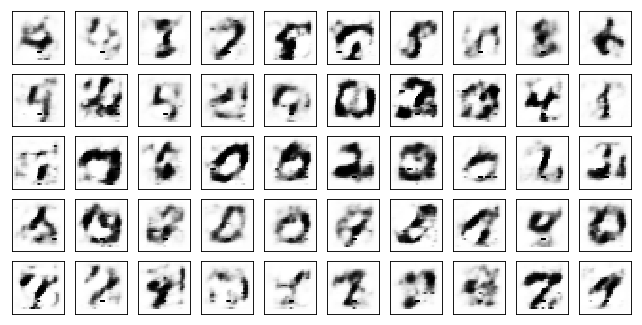

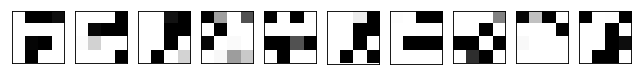

Test losses: 
Adam Discr+bn+dp: 0.77596664 / 5.09924459 / 0.00312956 

Train Epoch: 60 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1151 D:0.0002
Train Epoch: 60 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.2012 D:0.0001
Train Epoch: 60 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1735 D:0.0006
Train Epoch: 60 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0960 D:0.0001
Train Epoch: 60 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1493 D:0.0003
Train Epoch: 60 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1074 D:0.0010
Model Adam Discr+bn+dp:


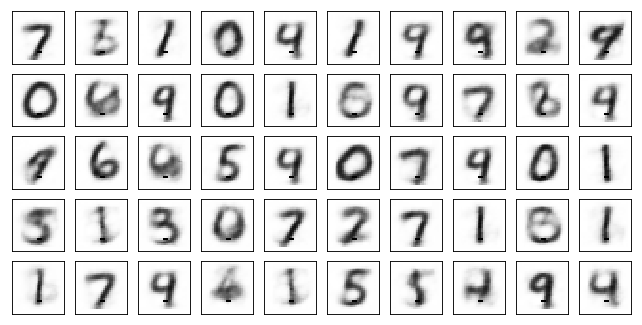

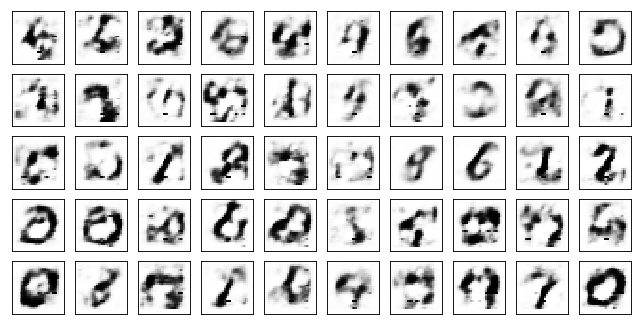

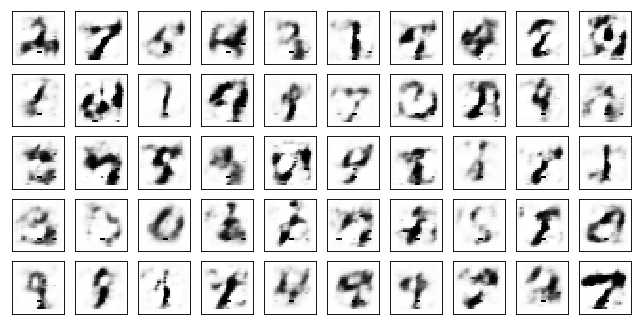

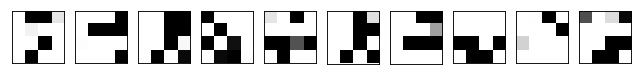

Test losses: 
Adam Discr+bn+dp: 0.77436060 / 5.04119825 / 0.00329380 

Train Epoch: 61 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1810 D:0.0002
Train Epoch: 61 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1979 D:0.0004
Train Epoch: 61 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1701 D:0.0002
Train Epoch: 61 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1636 D:0.0001
Train Epoch: 61 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1793 D:0.0001
Train Epoch: 61 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1726 D:0.0001
Model Adam Discr+bn+dp:


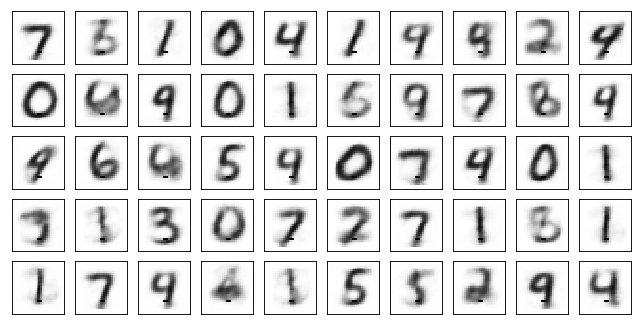

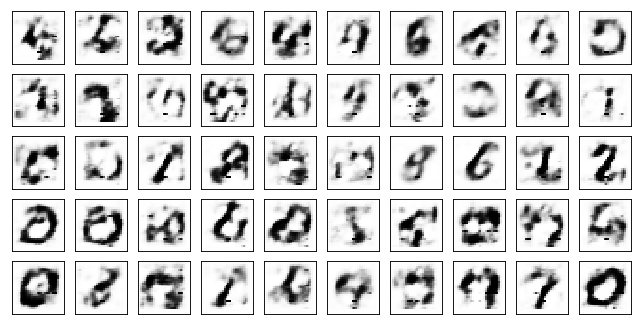

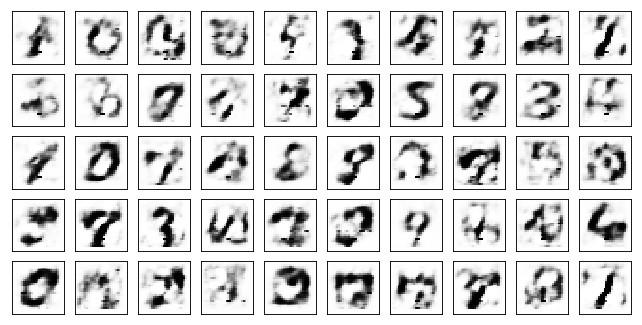

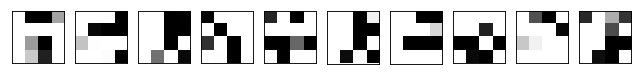

Test losses: 
Adam Discr+bn+dp: 0.76829261 / 5.19801283 / 0.00338927 

Train Epoch: 62 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1396 D:0.0005
Train Epoch: 62 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1338 D:0.0002
Train Epoch: 62 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1727 D:0.0001
Train Epoch: 62 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.0574 D:0.0003
Train Epoch: 62 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0836 D:0.0004
Train Epoch: 62 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1054 D:0.0041
Model Adam Discr+bn+dp:


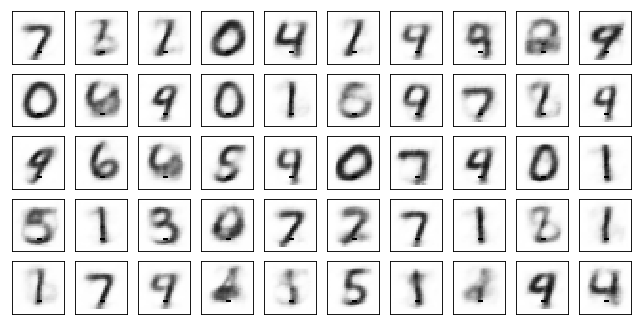

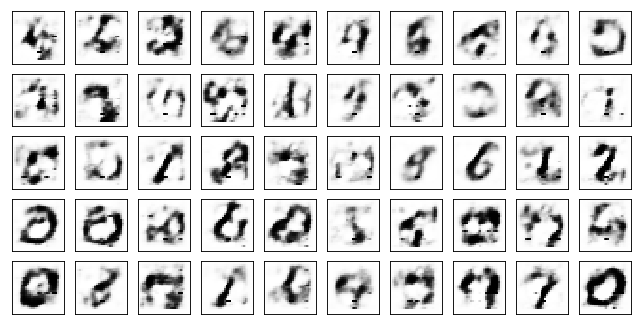

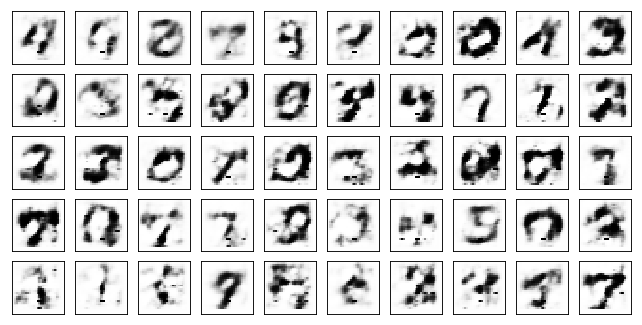

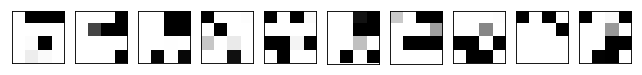

Test losses: 
Adam Discr+bn+dp: 0.77364725 / 4.85026264 / 0.00199874 

Train Epoch: 63 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1801 D:0.0004
Train Epoch: 63 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1631 D:0.0001
Train Epoch: 63 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.0627 D:0.0002
Train Epoch: 63 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1779 D:0.0002
Train Epoch: 63 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1502 D:0.0002
Train Epoch: 63 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1290 D:0.0001
Model Adam Discr+bn+dp:


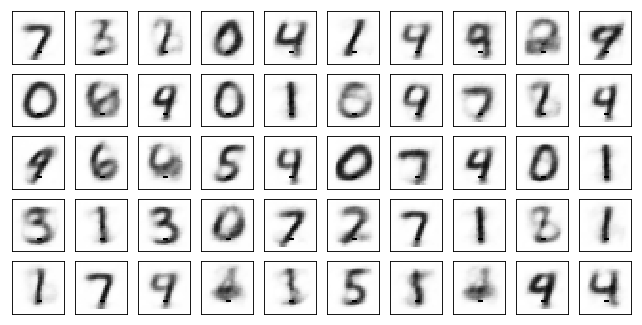

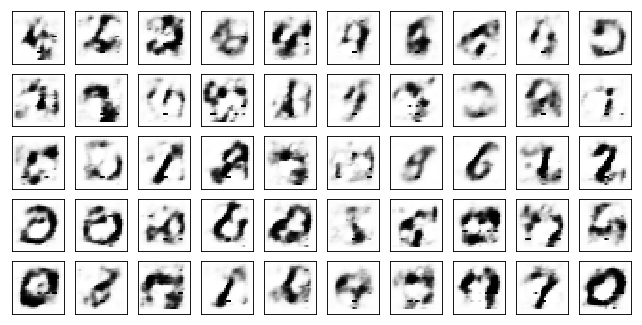

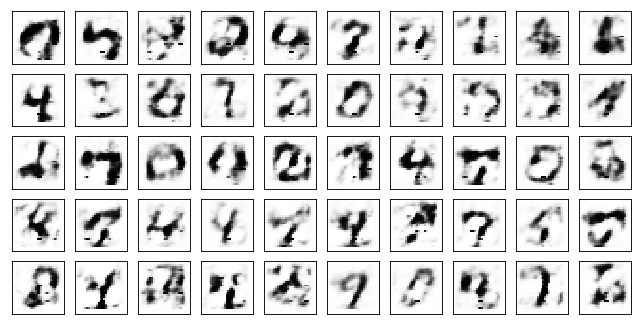

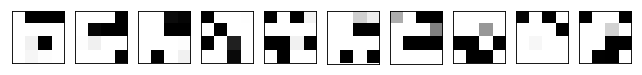

Test losses: 
Adam Discr+bn+dp: 0.76936972 / 4.90891123 / 0.00156560 

Train Epoch: 64 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1192 D:0.0001
Train Epoch: 64 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1775 D:0.0012
Train Epoch: 64 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1349 D:0.0002
Train Epoch: 64 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1291 D:0.0002
Train Epoch: 64 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1536 D:0.0001
Train Epoch: 64 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1782 D:0.0003
Model Adam Discr+bn+dp:


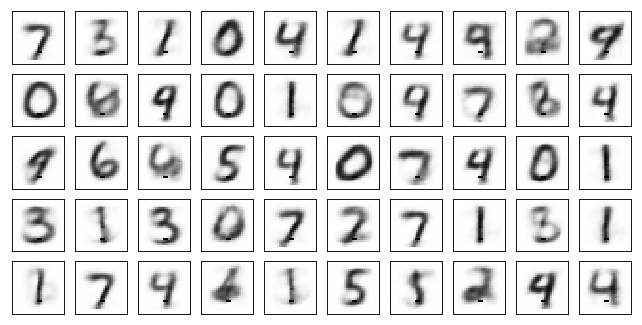

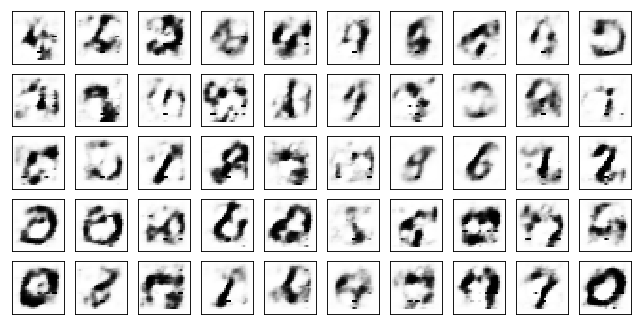

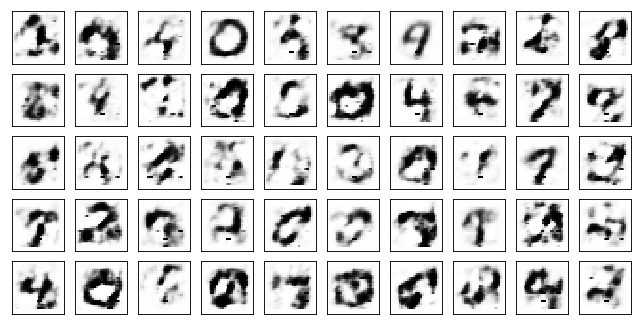

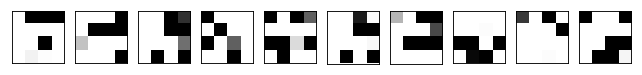

Test losses: 
Adam Discr+bn+dp: 0.76673013 / 5.03367519 / 0.00209841 

Train Epoch: 65 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1352 D:0.0002
Train Epoch: 65 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1099 D:0.0005
Train Epoch: 65 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1167 D:0.0003
Train Epoch: 65 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.2237 D:0.0001
Train Epoch: 65 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1724 D:0.0001
Train Epoch: 65 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.2003 D:0.0002
Model Adam Discr+bn+dp:


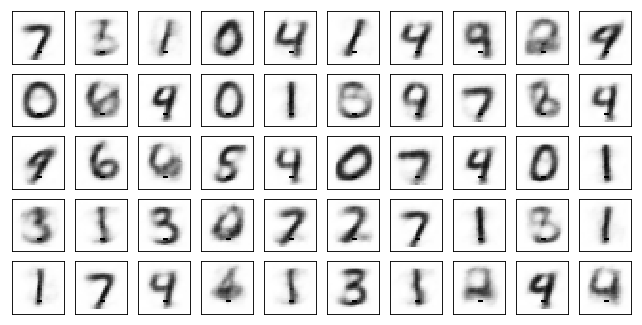

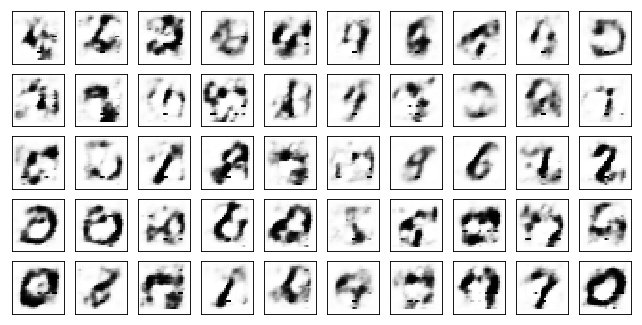

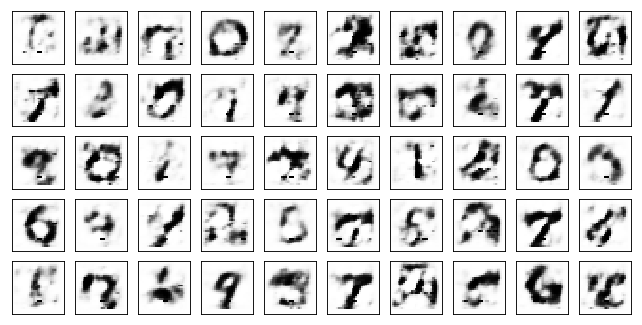

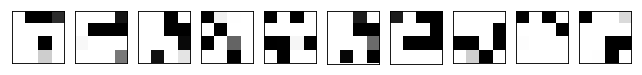

Test losses: 
Adam Discr+bn+dp: 0.76891416 / 5.08600998 / 0.00355815 

Train Epoch: 66 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1730 D:0.0001
Train Epoch: 66 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1614 D:0.0001
Train Epoch: 66 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1270 D:0.0002
Train Epoch: 66 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1679 D:0.0001
Train Epoch: 66 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.2269 D:0.0001
Train Epoch: 66 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.2414 D:0.0001
Model Adam Discr+bn+dp:


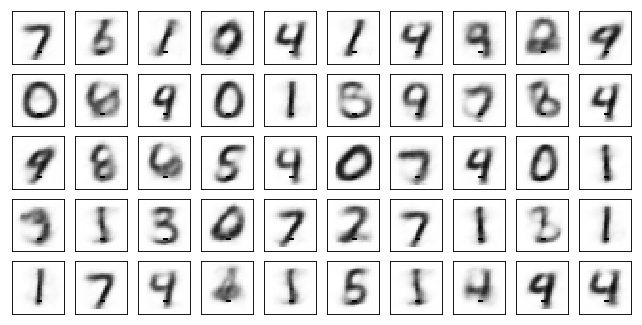

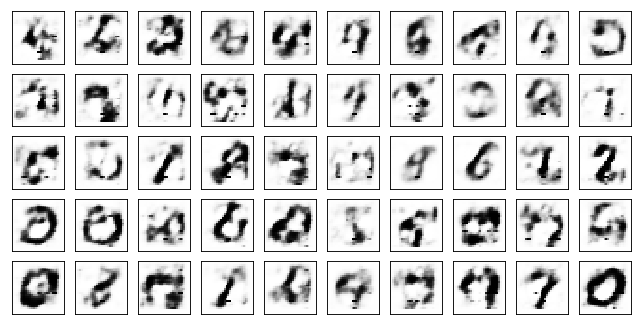

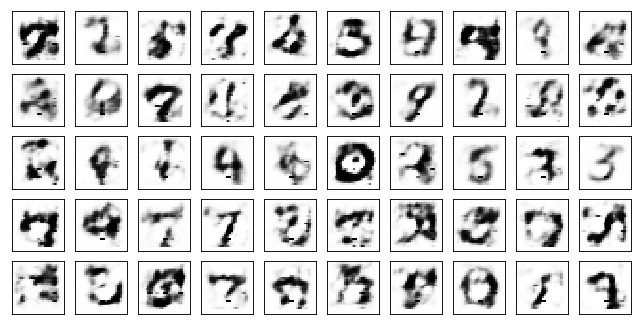

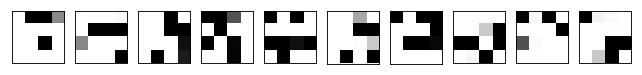

Test losses: 
Adam Discr+bn+dp: 0.76348299 / 5.24980879 / 0.00186736 

Train Epoch: 67 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.2168 D:0.0001
Train Epoch: 67 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1415 D:0.0001
Train Epoch: 67 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1570 D:0.0002
Train Epoch: 67 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1901 D:0.0003
Train Epoch: 67 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1419 D:0.0004
Train Epoch: 67 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1418 D:0.0001
Model Adam Discr+bn+dp:


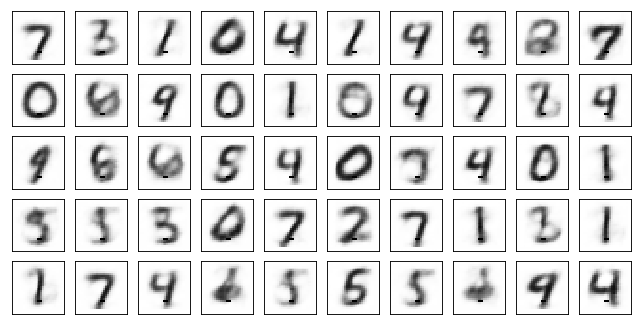

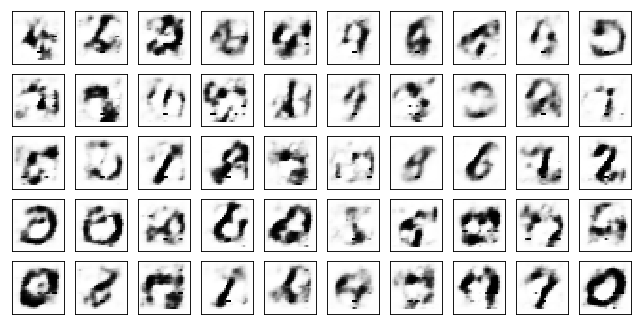

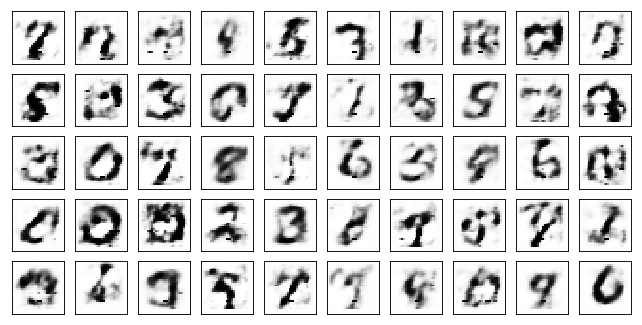

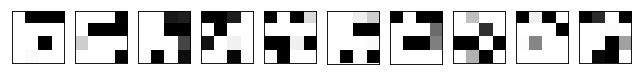

Test losses: 
Adam Discr+bn+dp: 0.76429605 / 4.92170906 / 0.00145681 

Train Epoch: 68 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1409 D:0.0001
Train Epoch: 68 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1422 D:0.0001
Train Epoch: 68 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1607 D:0.0002
Train Epoch: 68 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.2002 D:0.0001
Train Epoch: 68 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0973 D:0.0004
Train Epoch: 68 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1572 D:0.0001
Model Adam Discr+bn+dp:


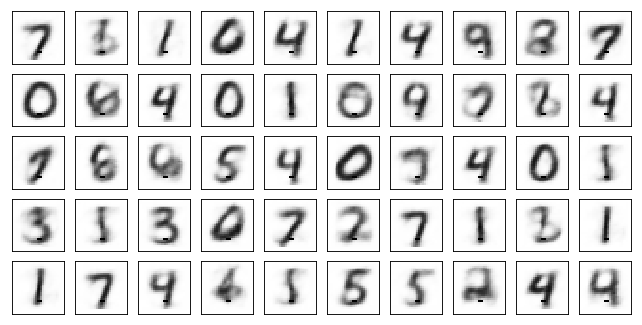

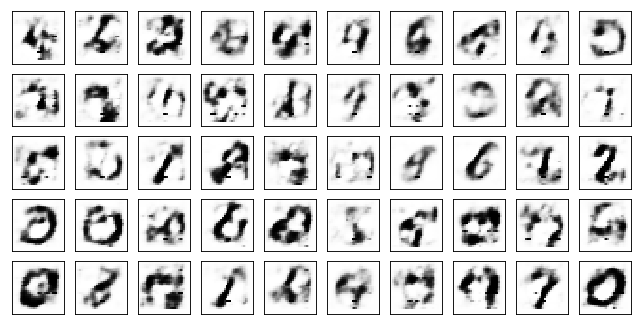

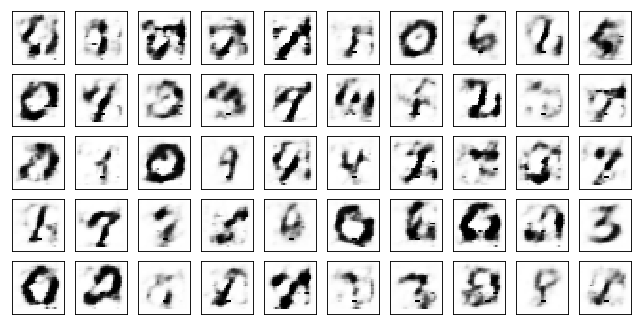

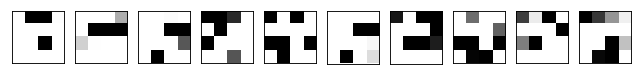

Test losses: 
Adam Discr+bn+dp: 0.77690148 / 5.05969858 / 0.00143583 

Train Epoch: 69 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1502 D:0.0002
Train Epoch: 69 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.1473 D:0.0001
Train Epoch: 69 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1717 D:0.0001
Train Epoch: 69 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1664 D:0.0001
Train Epoch: 69 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.1455 D:0.0006
Train Epoch: 69 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1493 D:0.0002
Model Adam Discr+bn+dp:


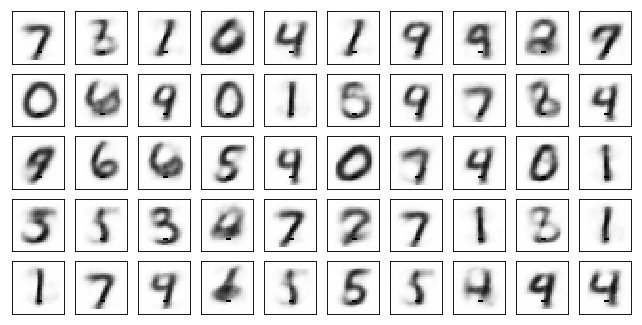

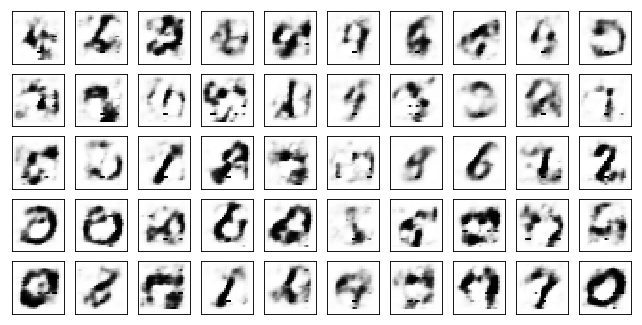

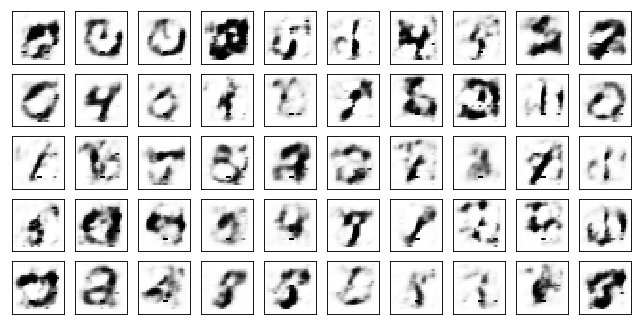

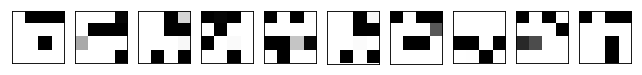

Test losses: 
Adam Discr+bn+dp: 0.77189064 / 5.13685322 / 0.00251528 

Train Epoch: 70 [0/50000 (0%)]	Losses Adam Discr+bn+dp: AE:1.1577 D:0.0001
Train Epoch: 70 [10000/50000 (20%)]	Losses Adam Discr+bn+dp: AE:1.2327 D:0.0001
Train Epoch: 70 [20000/50000 (40%)]	Losses Adam Discr+bn+dp: AE:1.1060 D:0.0002
Train Epoch: 70 [30000/50000 (60%)]	Losses Adam Discr+bn+dp: AE:1.1610 D:0.0001
Train Epoch: 70 [40000/50000 (80%)]	Losses Adam Discr+bn+dp: AE:1.0296 D:0.0002
Train Epoch: 70 [50000/50000 (100%)]	Losses Adam Discr+bn+dp: AE:1.1762 D:0.0001
Model Adam Discr+bn+dp:


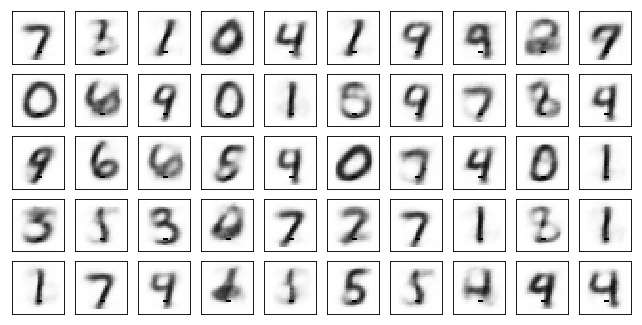

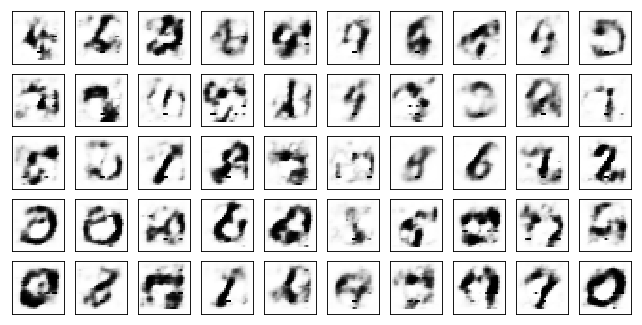

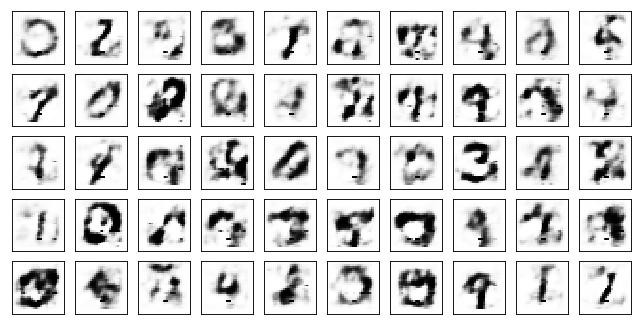

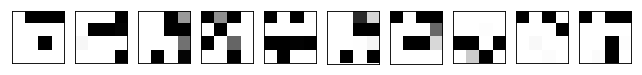

Test losses: 
Adam Discr+bn+dp: 0.76497668 / 5.18351364 / 0.00331110 



In [15]:
for epoch in range(1, 71):
    for model in models.values():
        model.train()
    train(epoch, models, train_log)
    for model in models.values():
        model.eval()
    test(models, valid_loader, test_log)

In [16]:
torch.save(models['Adam Discr+bn+dp'], './adam_ds2')

/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type ConvLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type FullyConnected. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't r

### Вывод результатов

In [17]:
model = torch.load('./adam_ds2')

In [18]:
data, _ = next(iter(test_loader))
output = model(data)
to_plot = output.view(-1, 1, 28, 28).clamp(-1, 1).data.numpy()
with torch.no_grad():
    encoded = model.encode(data)
    enc_to_lot = encoded.view(-1, 1, 4, 4).clamp(-1, 1).data.numpy()
    print ('enc=', encoded.shape)


enc= torch.Size([50, 16])


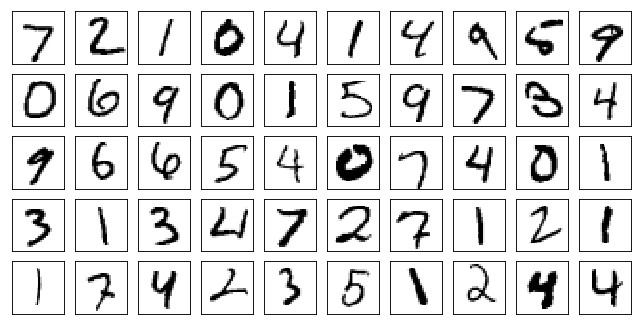

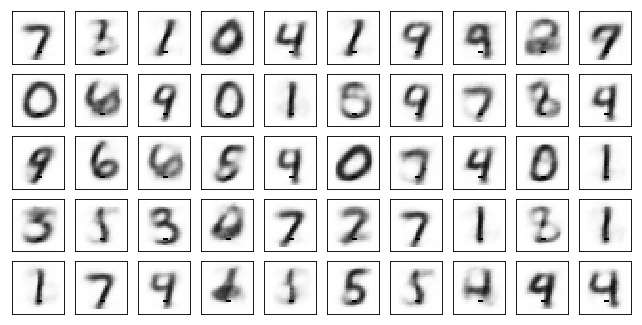

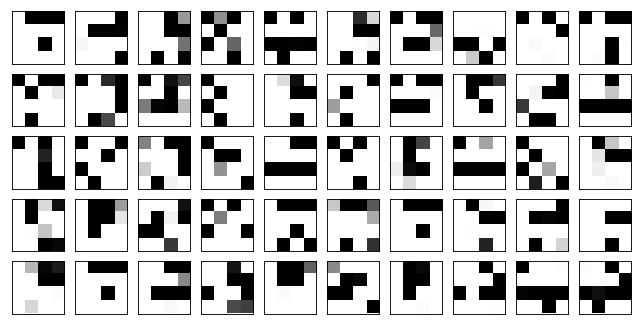

In [19]:
plot_mnist(data.data.numpy(), (5, 10))
plot_mnist(to_plot, (5, 10))
plot_latent(enc_to_lot, (5, 10))

In [20]:
def show_generated_samples():
    pred_z = torch.randn((50, 16))
       
    pred_gen = model.decode(pred_z)
    generated = pred_gen.view(-1, 1, 28, 28).data.numpy()  
    plot_mnist(generated, (5, 10))

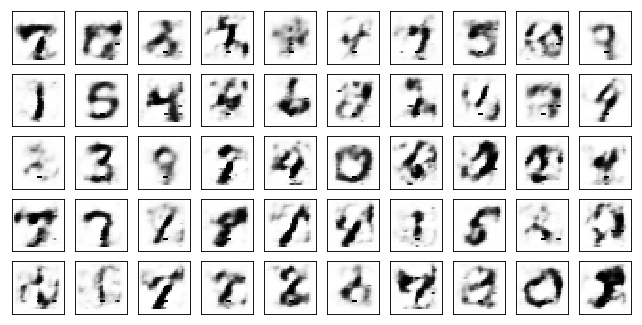

In [22]:
show_generated_samples()